# YULU BUSINESS CASE

## About Yulu

Yulu is India’s leading micro-mobility service provider, which offers unique vehicles for the daily commute. Starting off as a mission to eliminate traffic congestion in India, Yulu provides the safest commute solution through a user-friendly mobile app to enable shared, solo and sustainable commuting.

Yulu zones are located at all the appropriate locations (including metro stations, bus stands, office spaces, residential areas, corporate offices, etc) to make those first and last miles smooth, affordable, and convenient!

Yulu has recently suffered considerable dips in its revenues. They have contracted a consulting company to understand the factors on which the demand for these shared electric cycles depends. Specifically, they want to understand the factors affecting the demand for these shared electric cycles in the Indian market.

## Problem Statement

The company wants to know:

Which variables are significant in predicting the demand for shared electric cycles in the Indian market?
How well those variables describe the electric cycle demands?

## About the dataset

1.  datetime: datetime
2.  season: season (1: spring, 2: summer, 3: fall, 4: winter)
3.  holiday: whether day is a holiday or not (extracted from http://dchr.dc.gov/page/holiday-schedule)
4.  workingday: if day is neither weekend nor holiday is 1, otherwise is 0.
5.  weather:
    Clear, Few clouds, partly cloudy, partly cloudy ; Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist ; Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds ; Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog
6.  temp: temperature in Celsius
7.  atemp: feeling temperature in Celsius
8.  humidity: humidity
9.  windspeed: wind speed
10. casual: count of casual users
11. registered: count of registered users
12. count: count of total rental bikes including both casual and registered

In [1]:
# Importing required packages to be used

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import norm,stats,chi2_contingency,levene,kruskal,shapiro,f_oneway,ttest_ind
from IPython.display import display

In [2]:
# Importing and Reading top 10 data

df_yulu=pd.read_csv('https://d2beiqkhq929f0.cloudfront.net/public_assets/assets/000/001/428/original/bike_sharing.csv?1642089089')
df_yulu.head(10)

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0.0000,3,13,16
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0.0000,8,32,40
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0.0000,5,27,32
3,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0.0000,3,10,13
4,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0.0000,0,1,1
5,2011-01-01 05:00:00,1,0,0,2,9.84,12.880,75,6.0032,0,1,1
6,2011-01-01 06:00:00,1,0,0,1,9.02,13.635,80,0.0000,2,0,2
7,2011-01-01 07:00:00,1,0,0,1,8.20,12.880,86,0.0000,1,2,3
8,2011-01-01 08:00:00,1,0,0,1,9.84,14.395,75,0.0000,1,7,8
9,2011-01-01 09:00:00,1,0,0,1,13.12,17.425,76,0.0000,8,6,14


## General Analysis

In [3]:
# Defining the shape and dimension of data

a = df_yulu.shape
b = df_yulu.ndim

print("Shape of dataset -->", a)
print("Dimension of dataset -->",b)

Shape of dataset --> (10886, 12)
Dimension of dataset --> 2


### Remarks: -
1. There are 10886 rows and 12 columns present in the dataset.
2. Its 2-d dataset by nature

In [4]:
# Checking general info of cols

df_yulu.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    10886 non-null  object 
 1   season      10886 non-null  int64  
 2   holiday     10886 non-null  int64  
 3   workingday  10886 non-null  int64  
 4   weather     10886 non-null  int64  
 5   temp        10886 non-null  float64
 6   atemp       10886 non-null  float64
 7   humidity    10886 non-null  int64  
 8   windspeed   10886 non-null  float64
 9   casual      10886 non-null  int64  
 10  registered  10886 non-null  int64  
 11  count       10886 non-null  int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 1020.7+ KB


### Remarks: -

1. There is 1 string type column
(datetime)
2. Rest all are integer and float type

In [5]:
# Overall stats of entire dataset

df_yulu.describe(include="all")

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
count,10886,10886.000000,10886.000000,10886.000000,10886.000000,10886.00000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000
unique,10886,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,2011-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,2.506614,0.028569,0.680875,1.418427,20.23086,23.655084,61.886460,12.799395,36.021955,155.552177,191.574132
std,NaN,1.116174,0.166599,0.466159,0.633839,7.79159,8.474601,19.245033,8.164537,49.960477,151.039033,181.144454
min,NaN,1.000000,0.000000,0.000000,1.000000,0.82000,0.760000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,NaN,2.000000,0.000000,0.000000,1.000000,13.94000,16.665000,47.000000,7.001500,4.000000,36.000000,42.000000
50%,NaN,3.000000,0.000000,1.000000,1.000000,20.50000,24.240000,62.000000,12.998000,17.000000,118.000000,145.000000
75%,NaN,4.000000,0.000000,1.000000,2.000000,26.24000,31.060000,77.000000,16.997900,49.000000,222.000000,284.000000


In [6]:
# Categorical Data Description

df_yulu.describe(include= object).T

,count,unique,top,freq
datetime,10886,10886,2011-01-01 00:00:00,1


In [7]:
# Check on null/empty values

df_yulu.isna().sum().sort_values(ascending=False)

datetime      0
season        0
holiday       0
workingday    0
weather       0
temp          0
atemp         0
humidity      0
windspeed     0
casual        0
registered    0
count         0
dtype: int64

### Remarks: -

1. This is a check on the number of nulls/empty values present in the entire dataset
2. There are no nulls/empty values present in the dataset for any of the column values

In [8]:
# Finding duplicate rows based on all columns

duplicate_rows = df_yulu[df_yulu.duplicated()]
# Display the duplicate rows
print("Duplicate Rows:")
print(duplicate_rows)

# Count the total number of duplicate rows
num_duplicates = len(duplicate_rows)
print(f"Total number of duplicate rows: {num_duplicates}")

Duplicate Rows:
Empty DataFrame
Columns: [datetime, season, holiday, workingday, weather, temp, atemp, humidity, windspeed, casual, registered, count]
Index: []
Total number of duplicate rows: 0


### Remarks: -

1. This is solely targetting the number of duplicates across any of the data
2. There are no duplicates present in the entire dataset

In [9]:
# Checking for value ranges (e.g., numeric columns should not have negative va
numeric_columns = df_yulu.select_dtypes(include=['int', 'float']).columns
value_range_issues = (df_yulu[numeric_columns] < 0).any()
print("\nValue Range Issues:")
print(value_range_issues)


Value Range Issues:
season        False
holiday       False
workingday    False
weather       False
temp          False
atemp         False
humidity      False
windspeed     False
casual        False
registered    False
count         False
dtype: bool


### Remarks: -

1. This is for checking if there is any oddity or unexpected data/anomalies present under the
integer columns
2. There are no anomaly values and only numeric data is present across all the rows for
these integer columns

In [10]:
df_yulu.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    10886 non-null  object 
 1   season      10886 non-null  int64  
 2   holiday     10886 non-null  int64  
 3   workingday  10886 non-null  int64  
 4   weather     10886 non-null  int64  
 5   temp        10886 non-null  float64
 6   atemp       10886 non-null  float64
 7   humidity    10886 non-null  int64  
 8   windspeed   10886 non-null  float64
 9   casual      10886 non-null  int64  
 10  registered  10886 non-null  int64  
 11  count       10886 non-null  int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 1020.7+ KB


## Non-Graphical Analysis

### Uniques and Value counts

In [11]:
# Unique values for datetime
print("Total Unique values are: -")
print(df_yulu['datetime'].nunique())
print("Unique values are: -")
print(df_yulu['datetime'].unique())
# Value counts
print("\nValue counts are: -")
print(df_yulu['datetime'].value_counts().reset_index().to_string(index=False))

Total Unique values are: -
10886
Unique values are: -
['2011-01-01 00:00:00' '2011-01-01 01:00:00' '2011-01-01 02:00:00' ...
 '2012-12-19 21:00:00' '2012-12-19 22:00:00' '2012-12-19 23:00:00']

Value counts are: -
              index  datetime
2011-01-01 00:00:00         1
2012-05-01 21:00:00         1
2012-05-01 13:00:00         1
2012-05-01 14:00:00         1
2012-05-01 15:00:00         1
2012-05-01 16:00:00         1
2012-05-01 17:00:00         1
2012-05-01 18:00:00         1
2012-05-01 19:00:00         1
2012-05-01 20:00:00         1
2012-05-01 22:00:00         1
2012-05-02 08:00:00         1
2012-05-01 23:00:00         1
2012-05-02 00:00:00         1
2012-05-02 01:00:00         1
2012-05-02 02:00:00         1
2012-05-02 03:00:00         1
2012-05-02 04:00:00         1
2012-05-02 05:00:00         1
2012-05-02 06:00:00         1
2012-05-01 12:00:00         1
2012-05-01 11:00:00         1
2012-05-01 10:00:00         1
2012-05-01 09:00:00         1
2012-04-19 16:00:00         1
2012-0

### Remarks: -

1. There are 10886 unique values for product type in the entire dataset
2. The unique counts of each values are as displayed above:- 2011-01-01 00:00:00 = 1 time it
occurred in the dataset ,etc.

In [12]:
# Unique values for season
print("Total Unique values are: -")
print(df_yulu['season'].nunique())
print("Unique values are: -")
print(df_yulu['season'].unique())
# Value counts
print("\nValue counts are: -")
print(df_yulu['season'].value_counts().reset_index().to_string(index=False))

Total Unique values are: -
4
Unique values are: -
[1 2 3 4]

Value counts are: -
 index  season
     4    2734
     2    2733
     3    2733
     1    2686


### Remarks: -
There are 4 unique values for product type in the entire dataset
The unique counts of each values are as displayed above:- 4 = 2734 time it occurred in the dataset ,etc.

In [13]:
# Unique values for holiday
print("Total Unique values are: -")
print(df_yulu['holiday'].nunique())
print("Unique values are: -")
print(df_yulu['holiday'].unique())
# Value counts
print("\nValue counts are: -")
print(df_yulu['holiday'].value_counts().reset_index().to_string(index=False))

Total Unique values are: -
2
Unique values are: -
[0 1]

Value counts are: -
 index  holiday
     0    10575
     1      311


### Remarks: -
There are 2 unique values for product type in the entire dataset The unique counts of each values are as displayed above:- 0 = 10575 time it occurred in the dataset ,etc.

In [14]:
# Unique values for workingday
print("Total Unique values are: -")
print(df_yulu['workingday'].nunique())
print("Unique values are: -")
print(df_yulu['workingday'].unique())
# Value counts
print("\nValue counts are: -")
print(df_yulu['workingday'].value_counts().reset_index().to_string(index=False))

Total Unique values are: -
2
Unique values are: -
[0 1]

Value counts are: -
 index  workingday
     1        7412
     0        3474


### Remarks: -
There are 2 unique values for product type in the entire dataset The unique counts of each values are as displayed above:- 1 = 7412 time it occurred in the dataset ,etc.

In [15]:
# Unique values for weather
print("Total Unique values are: -")
print(df_yulu['weather'].nunique())
print("Unique values are: -")
print(df_yulu['weather'].unique())
# Value counts
print("\nValue counts are: -")
print(df_yulu['weather'].value_counts().reset_index().to_string(index=False))

Total Unique values are: -
4
Unique values are: -
[1 2 3 4]

Value counts are: -
 index  weather
     1     7192
     2     2834
     3      859
     4        1


### Remarks: -
There are 4 unique values for product type in the entire dataset The unique counts of each values are as displayed above:- 1 = 7192 time it occurred in the dataset ,etc.

In [16]:
# Unique values for temp
print("Total Unique values are: -")
print(df_yulu['temp'].nunique())
print("Unique values are: -")
print(df_yulu['temp'].unique())
# Value counts
print("\nValue counts are: -")
print(df_yulu['temp'].value_counts().reset_index().to_string(index=False))

Total Unique values are: -
49
Unique values are: -
[ 9.84  9.02  8.2  13.12 15.58 14.76 17.22 18.86 18.04 16.4  13.94 12.3
 10.66  6.56  5.74  7.38  4.92 11.48  4.1   3.28  2.46 21.32 22.96 23.78
 24.6  19.68 22.14 20.5  27.06 26.24 25.42 27.88 28.7  30.34 31.16 29.52
 33.62 35.26 36.9  32.8  31.98 34.44 36.08 37.72 38.54  1.64  0.82 39.36
 41.  ]

Value counts are: -
 index  temp
 14.76   467
 26.24   453
 28.70   427
 13.94   413
 18.86   406
 22.14   403
 25.42   403
 16.40   400
 22.96   395
 27.06   394
 24.60   390
 12.30   385
 21.32   362
 17.22   356
 13.12   356
 29.52   353
 10.66   332
 18.04   328
 20.50   327
 30.34   299
  9.84   294
 15.58   255
  9.02   248
 31.16   242
  8.20   229
 27.88   224
 23.78   203
 32.80   202
 11.48   181
 19.68   170
  6.56   146
 33.62   130
  5.74   107
  7.38   106
 31.98    98
 34.44    80
 35.26    76
  4.92    60
 36.90    46
  4.10    44
 37.72    34
 36.08    23
  3.28    11
  0.82     7
 38.54     7
 39.36     6
  2.46     5
  1.6

### Remarks: -
There are 49 unique values for product type in the entire dataset The unique counts of each values are as displayed above:- 14.76 = 467 times it occurred in the dataset ,etc.

In [17]:
# Unique values for temp
print("Total Unique values are: -")
print(df_yulu['atemp'].nunique())
print("Unique values are: -")
print(df_yulu['atemp'].unique())
# Value counts
print("\nValue counts are: -")
print(df_yulu['atemp'].value_counts().reset_index().to_string(index=False))

Total Unique values are: -
60
Unique values are: -
[14.395 13.635 12.88  17.425 19.695 16.665 21.21  22.725 21.97  20.455
 11.365 10.605  9.85   8.335  6.82   5.305  6.06   9.09  12.12   7.575
 15.91   3.03   3.79   4.545 15.15  18.18  25.    26.515 27.275 29.545
 23.485 25.76  31.06  30.305 24.24  18.94  31.82  32.575 33.335 28.79
 34.85  35.605 37.12  40.15  41.665 40.91  39.395 34.09  28.03  36.365
 37.88  42.425 43.94  38.635  1.515  0.76   2.275 43.18  44.695 45.455]

Value counts are: -
 index  atemp
31.060    671
25.760    423
22.725    406
20.455    400
26.515    395
16.665    381
25.000    365
33.335    364
21.210    356
30.305    350
15.150    338
21.970    328
24.240    327
17.425    314
31.820    299
34.850    283
27.275    282
32.575    272
11.365    271
14.395    269
29.545    257
19.695    255
15.910    254
12.880    247
13.635    237
34.090    224
12.120    195
28.790    175
23.485    170
10.605    166
35.605    159
 9.850    127
18.180    123
36.365    123
37.120    11

### Remarks: -
There are 60 unique values for product type in the entire dataset The unique counts of each values are as displayed above:- 31.060 = 671 times it occurred in the dataset ,etc.

In [18]:
# Unique values for humidity
print("Total Unique values are: -")
print(df_yulu['humidity'].nunique())
print("Unique values are: -")
print(df_yulu['humidity'].unique())
# Value counts
print("\nValue counts are: -")
print(df_yulu['humidity'].value_counts().reset_index().to_string(index=False))

Total Unique values are: -
89
Unique values are: -
[ 81  80  75  86  76  77  72  82  88  87  94 100  71  66  57  46  42  39
  44  47  50  43  40  35  30  32  64  69  55  59  63  68  74  51  56  52
  49  48  37  33  28  38  36  93  29  53  34  54  41  45  92  62  58  61
  60  65  70  27  25  26  31  73  21  24  23  22  19  15  67  10   8  12
  14  13  17  16  18  20  85   0  83  84  78  79  89  97  90  96  91]

Value counts are: -
 index  humidity
    88       368
    94       324
    83       316
    87       289
    70       259
    65       253
    46       247
    66       246
    77       244
    49       234
    55       224
    52       218
    56       208
    69       207
    93       205
    61       205
    62       202
    82       200
    74       197
    73       195
    43       193
    78       192
    50       190
    53       186
    41       184
    59       178
    81       174
    58       168
    40       167
    54       164
    60       162
    51       161
    4

### Remarks: -
There are 89 unique values for product type in the entire dataset The unique counts of each values are as displayed above:- 88 = 368 times it occurred in the dataset ,etc.

In [19]:
# Unique values for windspeed
print("Total Unique values are: -")
print(df_yulu['windspeed'].nunique())
print("Unique values are: -")
print(df_yulu['windspeed'].unique())
# Value counts
print("\nValue counts are: -")
print(df_yulu['windspeed'].value_counts().reset_index().to_string(index=False))

Total Unique values are: -
28
Unique values are: -
[ 0.      6.0032 16.9979 19.0012 19.9995 12.998  15.0013  8.9981 11.0014
 22.0028 30.0026 23.9994 27.9993 26.0027  7.0015 32.9975 36.9974 31.0009
 35.0008 39.0007 43.9989 40.9973 51.9987 46.0022 50.0021 43.0006 56.9969
 47.9988]

Value counts are: -
  index  windspeed
 0.0000       1313
 8.9981       1120
11.0014       1057
12.9980       1042
 7.0015       1034
15.0013        961
 6.0032        872
16.9979        824
19.0012        676
19.9995        492
22.0028        372
23.9994        274
26.0027        235
27.9993        187
30.0026        111
31.0009         89
32.9975         80
35.0008         58
39.0007         27
36.9974         22
43.0006         12
40.9973         11
43.9989          8
46.0022          3
56.9969          2
47.9988          2
51.9987          1
50.0021          1


### Remarks: -
There are 28 unique values for product type in the entire dataset The unique counts of each values are as displayed above:- 8.9981= 1120 times it occurred in the dataset ,etc.

In [20]:
# Unique values for casual
print("Total Unique values are: -")
print(df_yulu['casual'].nunique())
print("Unique values are: -")
print(df_yulu['casual'].unique())
# Value counts
print("\nValue counts are: -")
print(df_yulu['casual'].value_counts().reset_index().to_string(index=False))

Total Unique values are: -
309
Unique values are: -
[  3   8   5   0   2   1  12  26  29  47  35  40  41  15   9   6  11   4
   7  16  20  19  10  13  14  18  17  21  33  23  22  28  48  52  42  24
  30  27  32  58  62  51  25  31  59  45  73  55  68  34  38 102  84  39
  36  43  46  60  80  83  74  37  70  81 100  99  54  88  97 144 149 124
  98  50  72  57  71  67  95  90 126 174 168 170 175 138  92  56 111  89
  69 139 166 219 240 147 148  78  53  63  79 114  94  85 128  93 121 156
 135 103  44  49  64  91 119 167 181 179 161 143  75  66 109 123 113  65
  86  82 132 129 196 142 122 106  61 107 120 195 183 206 158 137  76 115
 150 188 193 180 127 154 108  96 110 112 169 131 176 134 162 153 210 118
 141 146 159 178 177 136 215 198 248 225 194 237 242 235 224 236 222  77
  87 101 145 182 171 160 133 105 104 187 221 201 205 234 185 164 200 130
 155 116 125 204 186 214 245 218 217 152 191 256 251 262 189 212 272 223
 208 165 229 151 117 199 140 226 286 352 357 367 291 233 190 283 295 232

### Remarks: -

There are 309 unique values for product type in the entire dataset The unique counts of each values are as displayed above:- 1 = 667 times it occurred in the dataset ,etc.

In [21]:
# Unique values for registered
print("Total Unique values are: -")
print(df_yulu['registered'].nunique())
print("Unique values are: -")
print(df_yulu['registered'].unique())
# Value counts
print("\nValue counts are: -")
print(df_yulu['registered'].value_counts().reset_index().to_string(index=False))

Total Unique values are: -
731
Unique values are: -
[ 13  32  27  10   1   0   2   7   6  24  30  55  47  71  70  52  26  31
  25  17  16   8   4  19  46  54  73  64  67  58  43  29  20   9   5   3
  63 153  81  33  41  48  53  66 146 148 102  49  11  36  92 177  98  37
  50  79  68 202 179 110  34  87 192 109  74  65  85 186 166 127  82  40
  18  95 216 116  42  57  78  59 163 158  51  76 190 125 178  39  14  15
  56  60  90  83  69  28  35  22  12  77  44  38  75 184 174 154  97 214
  45  72 130  94 139 135 197 137 141 156 117 155 134  89  80 108  61 124
 132 196 107 114 172 165 105 119 183 175  88  62  86 170 145 217  91 195
 152  21 126 115 223 207 123 236 128 151 100 198 157 168  84  99 173 121
 159  93  23 212 111 193 103 113 122 106  96 249 218 194 213 191 142 224
 244 143 267 256 211 161 131 246 118 164 275 204 230 243 112 238 144 185
 101 222 138 206 104 200 129 247 140 209 136 176 120 229 210 133 259 147
 227 150 282 162 265 260 189 237 245 205 308 283 248 303 291 280 208 286

### Remarks: -

There are 731 unique values for product type in the entire dataset The unique counts of each values are as displayed above:- 3 = 195 times it occurred in the dataset ,etc.

In [22]:
# Unique values for count
print("Total Unique values are: -")
print(df_yulu['count'].nunique())
print("Unique values are: -")
print(df_yulu['count'].unique())
# Value counts
print("\nValue counts are: -")
print(df_yulu['count'].value_counts().reset_index().to_string(index=False))

Total Unique values are: -
822
Unique values are: -
[ 16  40  32  13   1   2   3   8  14  36  56  84  94 106 110  93  67  35
  37  34  28  39  17   9   6  20  53  70  75  59  74  76  65  30  22  31
   5  64 154  88  44  51  61  77  72 157  52  12   4 179 100  42  57  78
  97  63  83 212 182 112  54  48  11  33 195 115  46  79  71  62  89 190
 169 132  43  19  95 219 122  45  86 172 163  69  23   7 210 134  73  50
  87 187 123  15  25  98 102  55  10  49  82  92  41  38 188  47 178 155
  24  18  27  99 217 130 136  29 128  81  68 139 137 202  60 162 144 158
 117  90 159 101 118 129  26 104  91 113 105  21  80 125 133 197 109 161
 135 116 176 168 108 103 175 147  96 220 127 205 174 121 230  66 114 216
 243 152 199  58 166 170 165 160 140 211 120 145 256 126 223  85 206 124
 255 222 285 146 274 272 185 191 232 327 224 107 119 196 171 214 242 148
 268 201 150 111 167 228 198 204 164 233 257 151 248 235 141 249 194 259
 156 153 244 213 181 221 250 304 241 271 282 225 253 237 299 142 313 310

### Remarks: -

There are 822 unique values for product type in the entire dataset The unique counts of each values are as displayed above:- 5 = 169 times it occurred in the dataset ,etc.

## Univariate Analysis

### Outlier Checks and Treatment

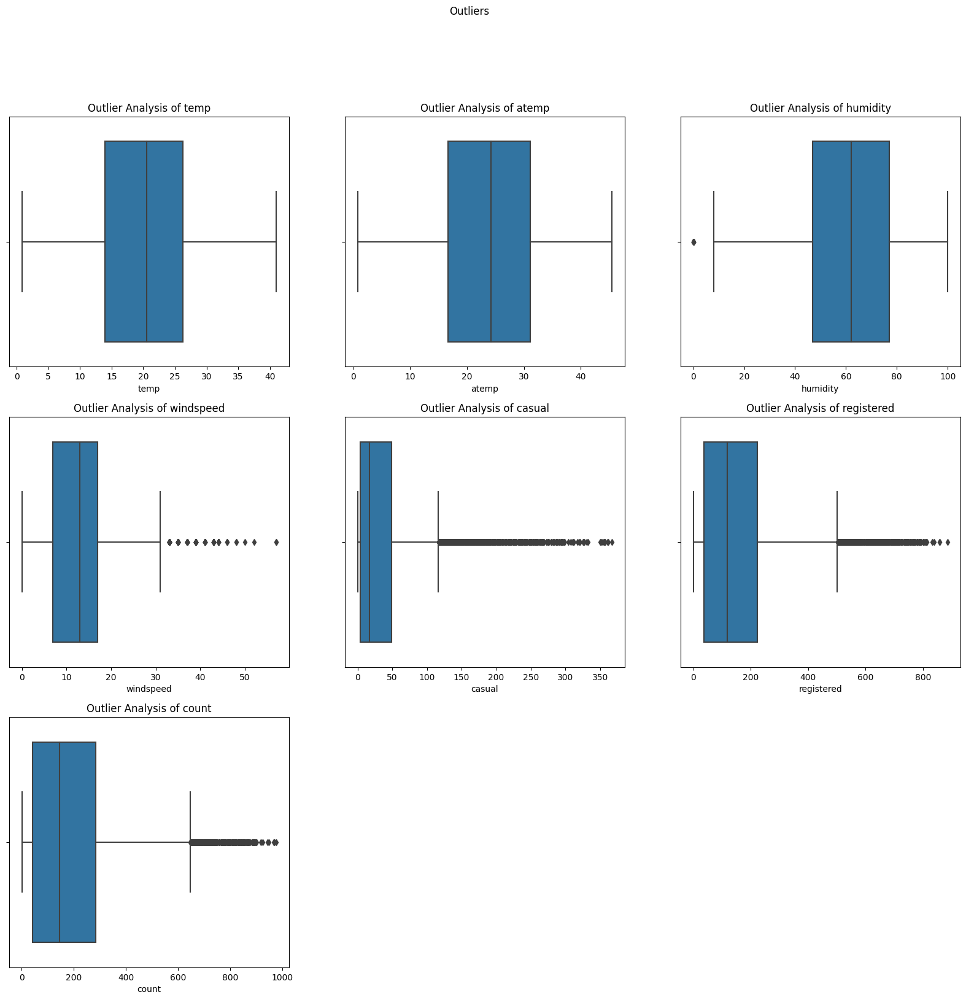

In [23]:
# Outliers handling

plt.figure(figsize = (20,18))
plt.suptitle("Outliers")
features = ['temp', 'atemp','humidity', 'windspeed', 'casual', 'registered', 'count']
for i in range(len(features)):                              
     plt.subplot(3, 3, i+1)
     sns.boxplot(x = df_yulu[features[i]])
     plt.title('Outlier Analysis of {}'.format(features[i]))
plt.show()

In [24]:
# Handling above outliers for last 4 plots

def handle_outliers(df, columns_list):
    for col in columns_list:
        Q1, Q2, Q3 = df[col].quantile([0.25, 0.5, 0.75])
        IQR = Q3 - Q1
        lower_whisker = Q1 - (1.5 * IQR)
        upper_whisker = Q3 + (1.5 * IQR)
# Replacing outliers with lower or upper whisker values
        df[col] = df[col].apply(lambda x: lower_whisker if x < lower_whisker else (upper_whisker if x > upper_whisker else x))

handle_outliers(df_yulu, ["windspeed", "casual", "registered", "count"])

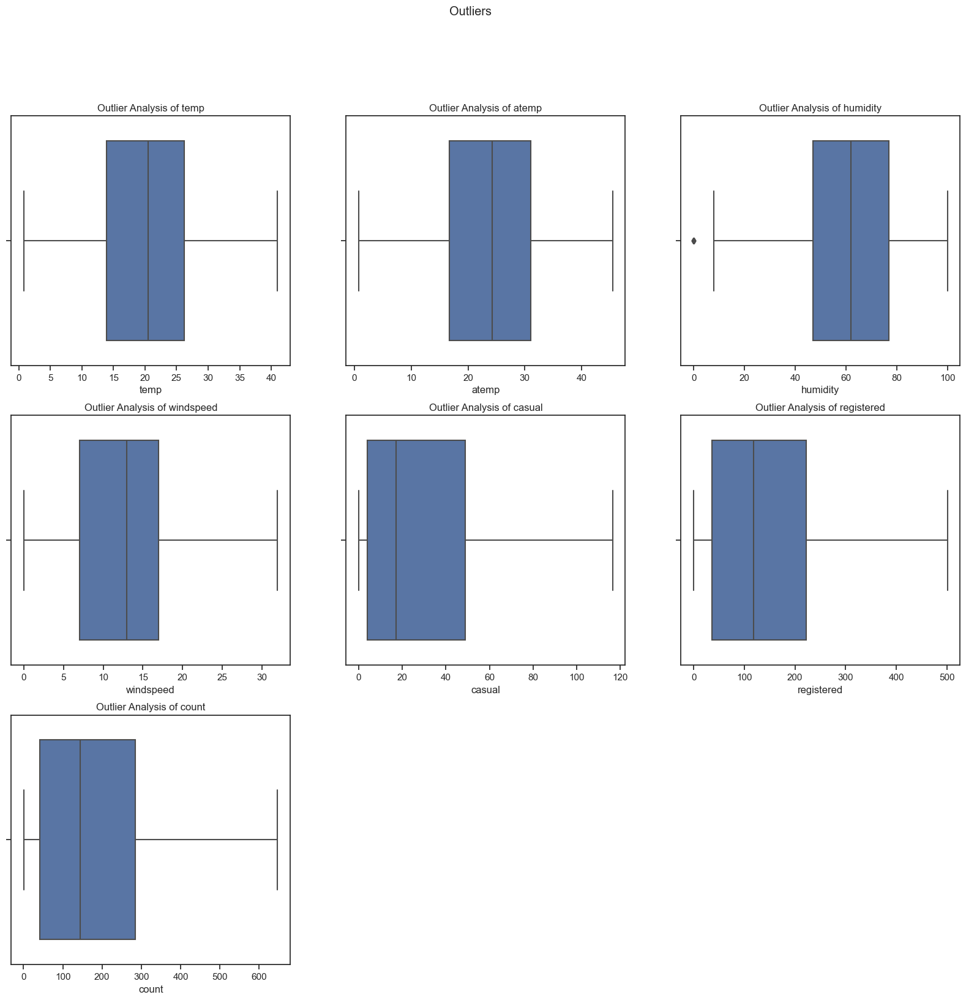

In [40]:
# Outliers are handled

plt.figure(figsize = (20,18))
plt.suptitle("Outliers")
features = ['temp', 'atemp','humidity', 'windspeed', 'casual', 'registered', 'count']
for i in range(len(features)):                              
     plt.subplot(3, 3, i+1)
     sns.boxplot(x = df_yulu[features[i]])
     plt.title('Outlier Analysis of {}'.format(features[i]))
plt.show()

### Handling column values

In [25]:
# Creating few columns from datetime field for better analysis of the data.
df_yulu['datetime']=pd.to_datetime(df_yulu['datetime'])

df_yulu["year"] = df_yulu["datetime"].dt.year
df_yulu["month"] = df_yulu["datetime"].dt.month
df_yulu["day"] = df_yulu["datetime"].dt.day
df_yulu["hour_of_the_day"] = df_yulu["datetime"].dt.hour
df_yulu['quarter'] = df_yulu['datetime'].dt.quarter

# Dropping the datetime column, as the required data has been extracted into different columns, and the columns serves no purpose
df_yulu.drop(["datetime"],axis=1, inplace=True)

# Modifying the data type of following few features, as per the understanding, since they are categorical data.
df_yulu["season"] = df_yulu["season"].astype("object")
df_yulu["holiday"] = df_yulu["holiday"].astype("object")
df_yulu["workingday"] = df_yulu["workingday"].astype("object")
df_yulu["weather"] = df_yulu["weather"].astype("object")
df_yulu["year"] = df_yulu["year"].astype("object")
df_yulu["month"] = df_yulu["month"].astype("object")
df_yulu["day"] = df_yulu["day"].astype("object")
df_yulu["hour_of_the_day"] = df_yulu["hour_of_the_day"].astype("object")
df_yulu["quarter"] = df_yulu["quarter"].astype("object")

In [97]:
# Column updation review

df_yulu.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   season           10886 non-null  object 
 1   holiday          10886 non-null  object 
 2   workingday       10886 non-null  object 
 3   weather          10886 non-null  object 
 4   temp             10886 non-null  float64
 5   atemp            10886 non-null  float64
 6   humidity         10886 non-null  int64  
 7   windspeed        10886 non-null  float64
 8   casual           10886 non-null  float64
 9   registered       10886 non-null  float64
 10  count            10886 non-null  float64
 11  year             10886 non-null  object 
 12  month            10886 non-null  object 
 13  day              10886 non-null  object 
 14  hour_of_the_day  10886 non-null  object 
 15  quarter          10886 non-null  object 
dtypes: float64(6), int64(1), object(9)
memory usage: 1.3+ MB


## Graphical analysis

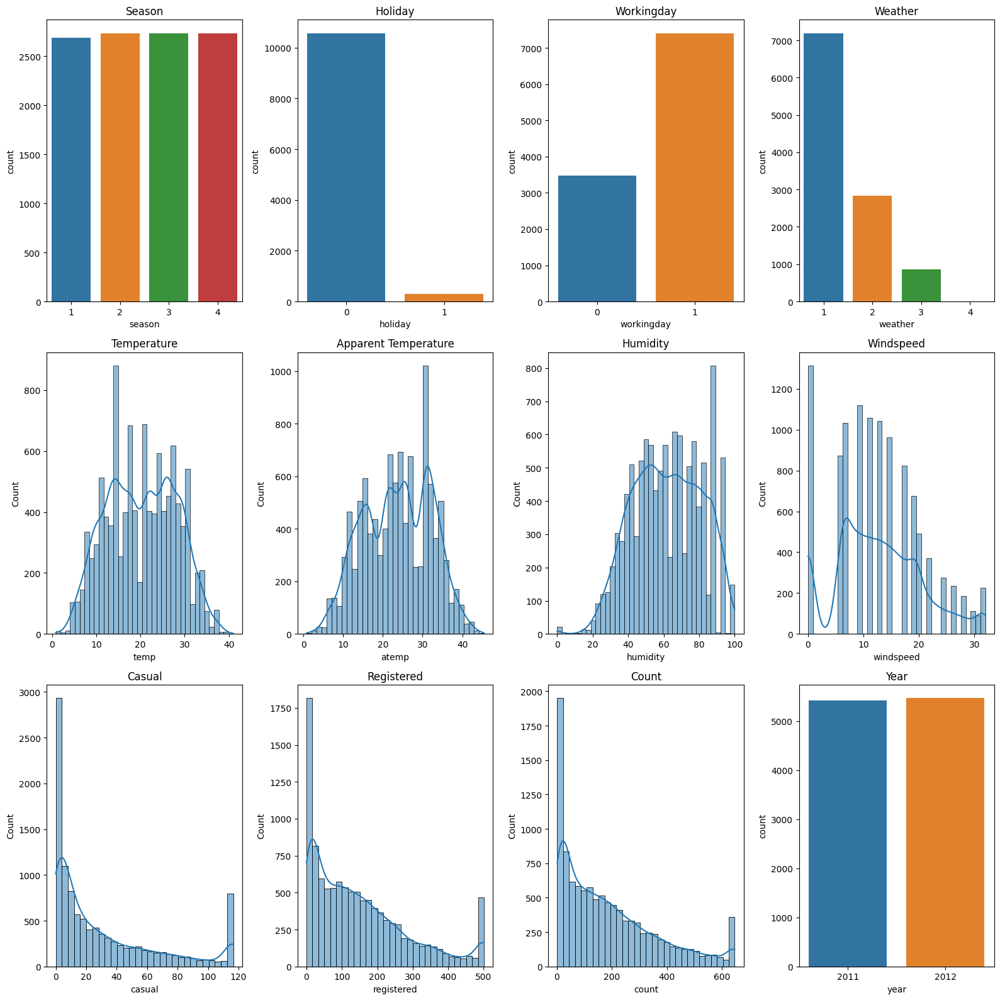

In [26]:
# Setting up a 4x4 grid of subplots for the plots
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(16, 16))

# Plot 1: Season (Categorical)
sns.countplot(data=df_yulu, x='season', ax=axes[0, 0])
axes[0, 0].set_title('Season')

# Plot 2: Holiday (Categorical)
sns.countplot(data=df_yulu, x='holiday', ax=axes[0, 1])
axes[0, 1].set_title('Holiday')

# Plot 3: Workingday (Categorical)
sns.countplot(data=df_yulu, x='workingday', ax=axes[0, 2])
axes[0, 2].set_title('Workingday')

# Plot 4: Weather (Categorical)
sns.countplot(data=df_yulu, x='weather', ax=axes[0, 3])
axes[0, 3].set_title('Weather')

# Plot 5: Temperature (Continuous)
sns.histplot(data=df_yulu, x='temp', ax=axes[1, 0], kde=True)
axes[1, 0].set_title('Temperature')

# Plot 6: Apparent Temperature (Continuous)
sns.histplot(data=df_yulu, x='atemp', ax=axes[1, 1], kde=True)
axes[1, 1].set_title('Apparent Temperature')

# Plot 7: Humidity (Continuous)
sns.histplot(data=df_yulu, x='humidity', ax=axes[1, 2], kde=True)
axes[1, 2].set_title('Humidity')

# Plot 8: Windspeed (Continuous)
sns.histplot(data=df_yulu, x='windspeed', ax=axes[1, 3], kde=True)
axes[1, 3].set_title('Windspeed')

# Plot 9: Casual (Continuous)
sns.histplot(data=df_yulu, x='casual', ax=axes[2, 0], kde=True)
axes[2, 0].set_title('Casual')

# Plot 10: Registered (Continuous)
sns.histplot(data=df_yulu, x='registered', ax=axes[2, 1], kde=True)
axes[2, 1].set_title('Registered')

# Plot 11: Count (Continuous)
sns.histplot(data=df_yulu, x='count', ax=axes[2, 2], kde=True)
axes[2, 2].set_title('Count')

# Plot 12: Year (Categorical)
sns.countplot(data=df_yulu, x='year', ax=axes[2, 3])
axes[2, 3].set_title('Year')

# Adjusting the layout and displaying the plots
plt.tight_layout()
plt.show()     

### Observations

1.  Graph 1: - Season 1 has less number of counts as compared to 2,3 & 4 which are almost same.

2.  Graph 2: - Holiday 1 is the least and the maximum Holiday is 0, i.e., less holiday are present compared to working days in dataset.

3.  Graph 3: - Working Day 0 is the least and the maximum Working Day is 1, i.e., less holiday are present compared to working days in dataset.
    
4.  Graph 4: - Clear, Few clouds, partly cloudy, partly cloudy has max occurence and Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog has least.
    
5.  Graph 5: - The max temp recorded is around 15° cel and the entire distribution is unevenly distributed.

6.  Graph 6: - The max feel temp recorded is around 32° cel and the entire distribution is unevenly distributed.

7.  Graph 7: - The max humidity is around 83 and the least recorded lies between 5-10.

8.  Graph 8: - The max windspeed recorded is around 1 and least is around 31.
    
9.  Graph 9: - The max count of casual users is 1 and there is a decline in the data points with a sudden peak towards the end (120).
    
10. Graph 10: - The max count of registered users is 1 and there is a decline in the data points with a sudden peak towards the end (500).
    
11. Graph 11: - The max count of total rental bikes including both casual and registered is around 1 and there is a decline in the data points with a sudden peak towards the end (620).
    
12. Graph 12: - Year 2012 has slightly more users compared to year 2011.

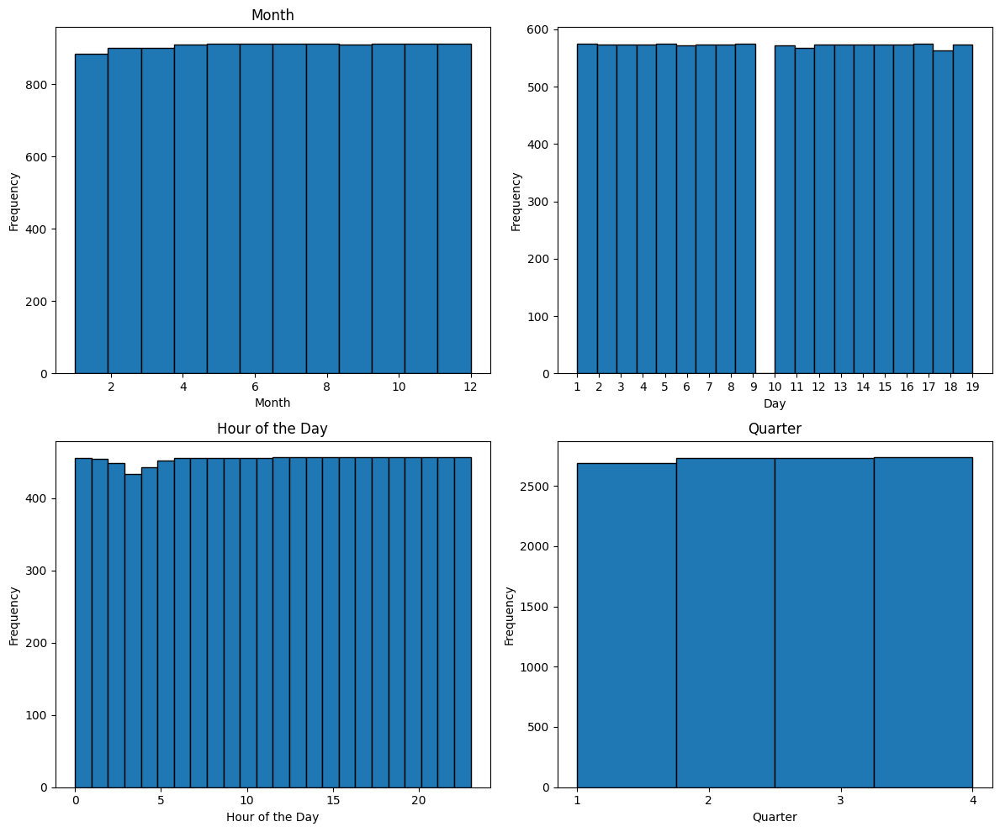

In [27]:
# Setting up a 2x2 grid of subplots for the histograms
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

# Plot 1: Month (Categorical)
axes[0, 0].hist(df_yulu['month'], bins=12, edgecolor='black')
axes[0, 0].set_title('Month')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('Frequency')

# Plot 2: Day (Categorical)
axes[0, 1].set_xlabel('Day')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].hist(df_yulu['day'], bins=20, edgecolor='black')
whole_numbers = [int(x) for x in df_yulu['day'].unique()]
axes[0, 1].set_xticks(whole_numbers)
axes[0, 1].set_xticklabels(whole_numbers)

# Plot 3: Hour of the Day (Categorical)
axes[1, 0].hist(df_yulu['hour_of_the_day'], bins=24, edgecolor='black')
axes[1, 0].set_title('Hour of the Day')
axes[1, 0].set_xlabel('Hour of the Day')
axes[1, 0].set_ylabel('Frequency')

# Plot 4: Quarter (Categorical)
axes[1, 1].hist(df_yulu['quarter'], bins=4, edgecolor='black')
axes[1, 1].set_title('Quarter')
axes[1, 1].set_xlabel('Quarter')
axes[1, 1].set_ylabel('Frequency')
whole_numbers = [int(x) for x in df_yulu['quarter'].unique()]
axes[1, 1].set_xticks(whole_numbers)
axes[1, 1].set_xticklabels(whole_numbers)

# Adjusting the layout and displaying the plots
plt.tight_layout()
plt.show()

### Observations

1. Graph 1: - January month has slight less users followed by February until there is saturation in counts from April onwards.

2. Graph 2: - There is not much difference in counts of days and its almost uniform across dataset and least is at 18.

3. Graph 3: - There is not much difference in hours of days and its almost uniform across dataset and least is at 

4. Graph 4: - Average count of rented cycles is lower in first quarter, then average is same across rest 3 quarters.

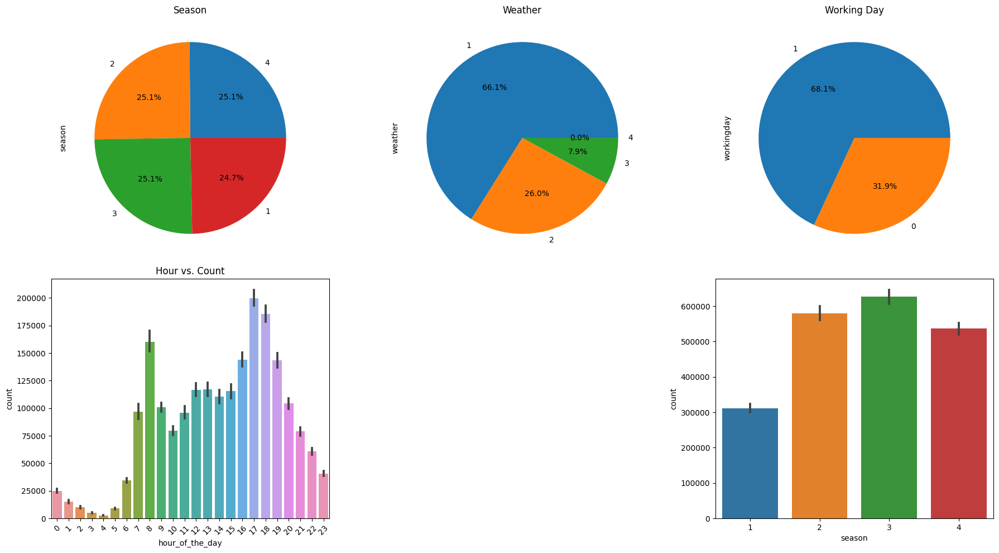

In [28]:
# Creating subplots for the pie charts and bar plots
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Plot 1: Pie Chart for 'season'
df_yulu['season'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 0])
axes[0, 0].set_title('Season')

# Plot 2: Pie Chart for 'weather'
df_yulu['weather'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 1])
axes[0, 1].set_title('Weather')

# Plot 3: Pie Chart for 'workingday'
df_yulu['workingday'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 2])
axes[0, 2].set_title('Working Day')

# Plot 4: Bar Plot for 'hour' vs. 'count'
sns.barplot(data=df_yulu, x='hour_of_the_day', y='count', estimator=sum, ax=axes[1, 0])
axes[1, 0].set_title('Hour vs. Count')
axes[1, 0].set_xticklabels(axes[1, 0].get_xticklabels(), rotation=45)

# Plot 6: Bar Plot for 'season' vs. 'count'
sns.barplot(data=df_yulu, x='season', y='count', estimator=sum, ax=axes[1, 2])
axes[1, 1].set_title('Season vs. Count')

# Dropping unused axes
fig.delaxes(axes[1][1])

# Adjusting the layout and displaying the plots
plt.tight_layout()
plt.show()

### Observations

1. Graph 1: - Spring (1 season) has less spread as compared to rest 3 seasons which are same w.r.t percentage distribution.

2. Graph 2: - Average count of rented cycles is higher in clean/cloudy weather, followed by mist/cloudy weather.

3. Graph 3: - Working days has 68.1% distribution compared to non-working days (31.9%).

4. Graph 4: - Average count of rented cycles stays considerably higher from 7am till 9am, and then start decreasing till 3pm, and again start increasing till 7pm, with highest at 5pm.

5. Graph 5: - The max season is of fall followed by summer.

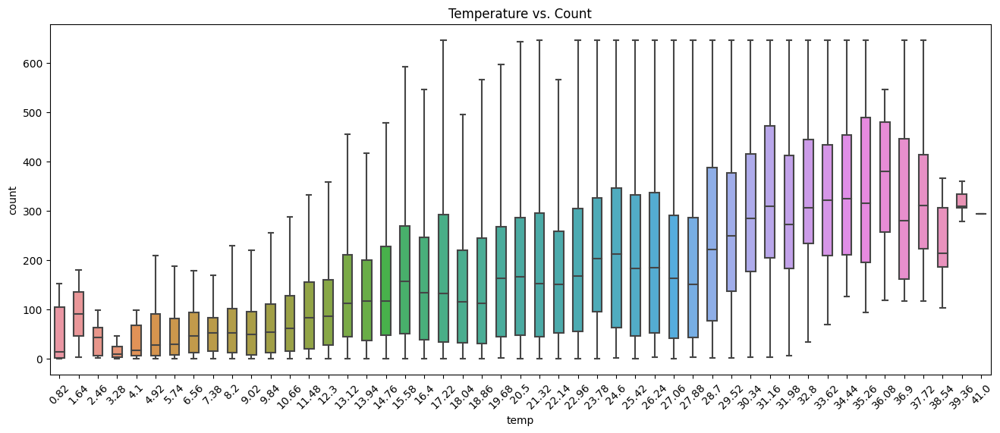

In [29]:
# Creating a figure
plt.figure(figsize=(16, 6))

# Plotting the boxplot with whole numbers on the x-axis
sns.boxplot(data=df_yulu, x='temp', y='count', width=0.5, showfliers=False)
plt.title('Temperature vs. Count')

# Setting the x-axis to display numbers
plt.xticks(rotation=45)

plt.show()

### Observations

The count median of temp lies maximum around 100-150 for max observed temp which falls between ~ 14° to ~ 28°. Also the max temp observed (upper whiskers) is around 17°.


## Bivariate Analysis

/var/folders/3x/g_8g6pcj3cv64hq5g80q28tw0000gp/T/ipykernel_36376/1606522860.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=df_yulu, x='month', y='count', hue='year', palette='Set1', ci=None, ax=axes[0, 1])
/var/folders/3x/g_8g6pcj3cv64hq5g80q28tw0000gp/T/ipykernel_36376/1606522860.py:24: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=df_yulu, x='day', y='count', hue='holiday', palette='husl', ci=None, ax=axes[1, 1])


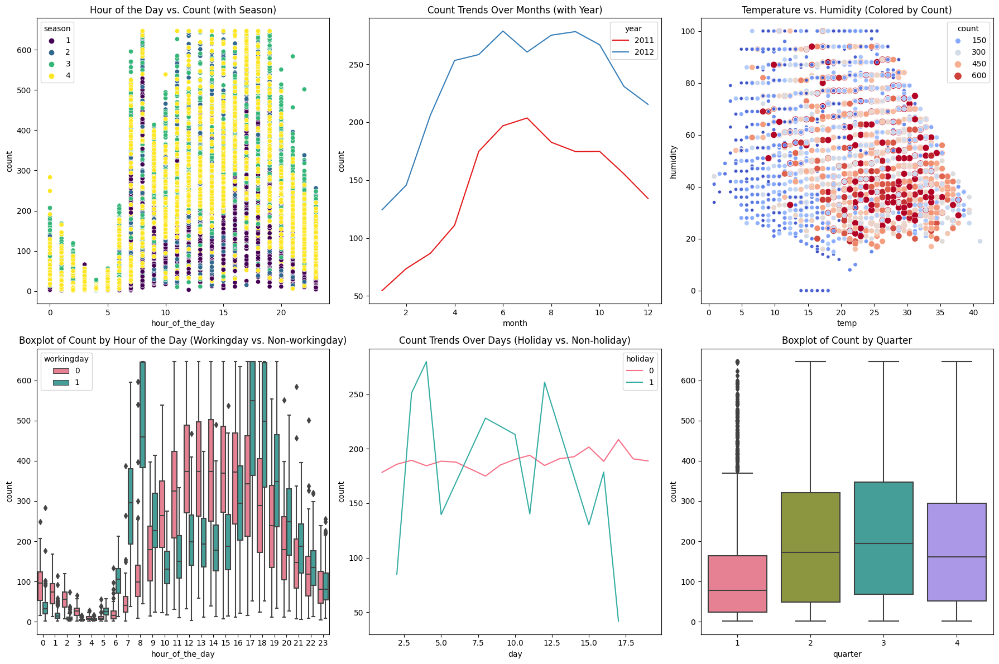

In [30]:
# Creating a 2x3 grid of subplots
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Plot 1 - Scatter plot with 'season' as hue
sns.scatterplot(data=df_yulu, x='hour_of_the_day', y='count', hue='season', palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('Hour of the Day vs. Count (with Season)')

# Plot 2 - Line plot with 'year' as hue
sns.lineplot(data=df_yulu, x='month', y='count', hue='year', palette='Set1', ci=None, ax=axes[0, 1])
axes[0, 1].set_title('Count Trends Over Months (with Year)')

# Plot 3 - Scatter plot with 'count' as color scale
sns.scatterplot(data=df_yulu, x='temp', y='humidity', hue='count', palette='coolwarm', size='count', ax=axes[0, 2])
axes[0, 2].set_title('Temperature vs. Humidity (Colored by Count)')

# Plot 4 - Box plots with 'workingday' as hue
sns.boxplot(data=df_yulu, x='hour_of_the_day', y='count', hue='workingday', palette='husl', ax=axes[1, 0])
axes[1, 0].set_title('Boxplot of Count by Hour of the Day (Workingday vs. Non-workingday)')

# Plot 5 - Line plot with 'holiday' as hue
sns.lineplot(data=df_yulu, x='day', y='count', hue='holiday', palette='husl', ci=None, ax=axes[1, 1])
axes[1, 1].set_title('Count Trends Over Days (Holiday vs. Non-holiday)')

# Plot 6 - Box plots for 'quarter'
sns.boxplot(data=df_yulu, x='quarter', y='count', palette='husl', ax=axes[1, 2])
axes[1, 2].set_title('Boxplot of Count by Quarter')

# Adjusting the layout and displaying the plots
plt.tight_layout()
plt.show()

### Observations

1. Graph 1: - The max distributions are w.r.t season 4 and between 12-5 pm. The less distributions are w.r.t season 3.

2. Graph 2: - The trend is observed more in 2012 compared to 2011 with peak during the months of jun(2012) 7 jul(2011) and after that there is a decline seeing in the trend when winter approaches.
    
3. Graph 3: - The count of temp is more for temp ranges ~ 22-30° (count >600) and the distribution of counts is more w.r.t 150.
    
4. Graph 4: - During working days, the peak hours of usage is basically around 8am (people going to office, etc.) & then around 6-7pm (people going back home).
    
5. Graph 5: - The peak usage is during working days/non-holiday as compared to holidays(peak is at during evening).

6. Graph 6: - The median quarter count is around 180 for 2, 3 & 4. The highest is for quarter 3.

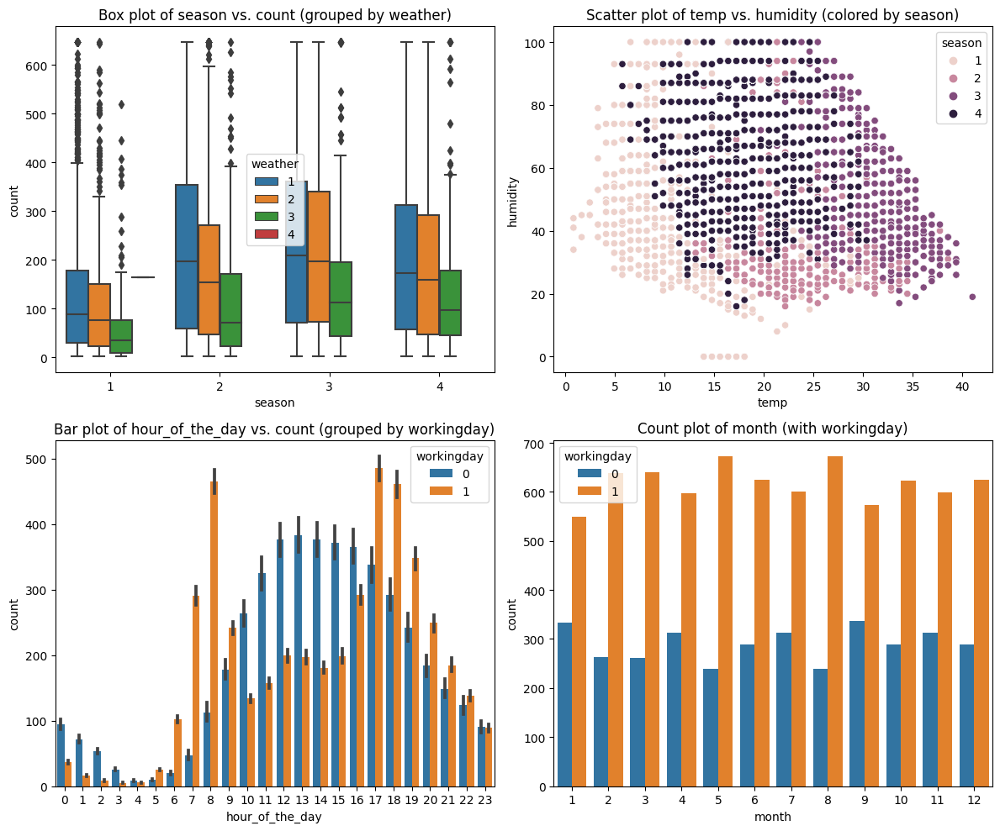

In [31]:
# Creating a 2x2 grid of subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Plot 1 - Box plot of 'season' vs. 'count' grouped by 'weather'
sns.boxplot(x='season', y='count', hue='weather', data=df_yulu, ax=axes[0, 0])
axes[0, 0].set_title('Box plot of season vs. count (grouped by weather)')

# Plot 2 - Scatter plot of 'temp' vs. 'humidity' colored by 'season'
sns.scatterplot(x='temp', y='humidity', hue='season', data=df_yulu, ax=axes[0, 1])
axes[0, 1].set_title('Scatter plot of temp vs. humidity (colored by season)')

# Plot 3 - Bar plot of 'hour_of_the_day' vs. 'count' grouped by 'workingday'
sns.barplot(x='hour_of_the_day', y='count', hue='workingday', data=df_yulu, ax=axes[1, 0])
axes[1, 0].set_title('Bar plot of hour_of_the_day vs. count (grouped by workingday)')

# Plot 4 - Count plot of 'month' with 'workingday' as hue
sns.countplot(x='month', hue='workingday', data=df_yulu, ax=axes[1, 1])
axes[1, 1].set_title('Count plot of month (with workingday)')

# Adjusting the layout and displaying the plots
plt.tight_layout()
plt.show()

### Observations

Graph 1: - Another way of expressing season w.r.t weather based on counts. 

Graph 2: - The max distribution is w.r.t season 3 and 4 with high humidity that lies between temp ranges 12-25°.

Graph 3: - Another way of expressing working day w.r.t hours of day based on counts. 

Graph 4: - Another way of expressing working day w.r.t month based on counts.

/var/folders/3x/g_8g6pcj3cv64hq5g80q28tw0000gp/T/ipykernel_36376/2892442352.py:17: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='day', y='count', hue='weather', data=df_yulu, palette='husl', ci=None, ax=axes[1, 1])


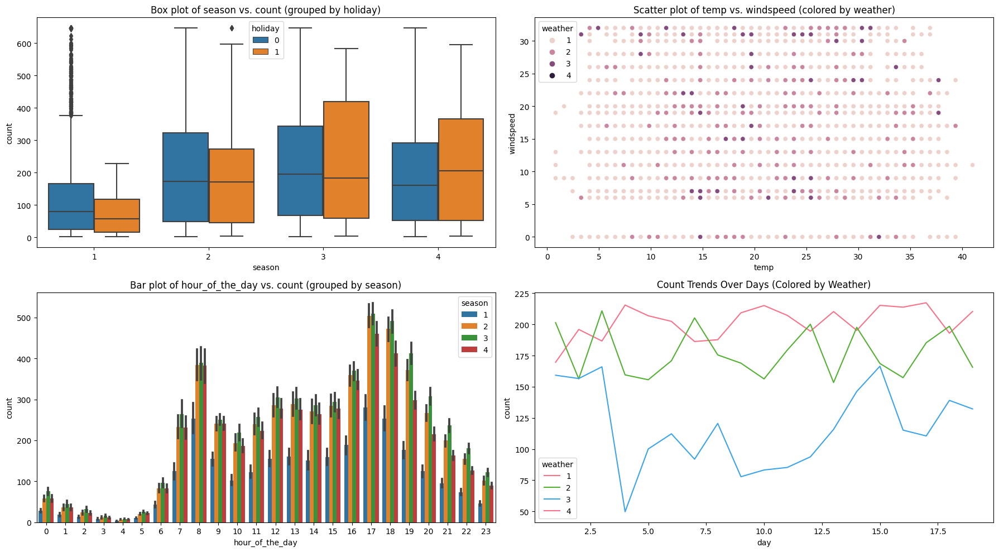

In [32]:
# Create a 2x3 grid of subplots
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

# Plot 1 - Box plot of 'season' vs. 'count' grouped by 'holiday'
sns.boxplot(x='season', y='count', hue='holiday', data=df_yulu, ax=axes[0, 0])
axes[0, 0].set_title('Box plot of season vs. count (grouped by holiday)')

# Plot 2 - Scatter plot of 'temp' vs. 'windspeed' colored by 'weather'
sns.scatterplot(x='temp', y='windspeed', hue='weather', data=df_yulu, ax=axes[0, 1])
axes[0, 1].set_title('Scatter plot of temp vs. windspeed (colored by weather)')

# Plot 3 - Bar plot of 'hour_of_the_day' vs. 'count' grouped by 'season'
sns.barplot(x='hour_of_the_day', y='count', hue='season', data=df_yulu, ax=axes[1, 0])
axes[1, 0].set_title('Bar plot of hour_of_the_day vs. count (grouped by season)')

# Plot 4 - Line plot of 'day' vs. 'count' colored by 'weather'
sns.lineplot(x='day', y='count', hue='weather', data=df_yulu, palette='husl', ci=None, ax=axes[1, 1])
axes[1, 1].set_title('Count Trends Over Days (Colored by Weather)')

# Adjusting the layout and displaying the plots
plt.tight_layout()
plt.show()

### Observations: -

1. Graph 1: - The median of season 2 and 3 for both holiday/non-holiday lies around 180 and highest is for season 3 and holiday.

2. Graph 2: - Another way of plotting weather and temp and windspeed. The distribution is scattered and for temp around 25° the weather 3(light snow,etc.) has more windspeed around 32.
    
3. Graph 3: - The max season w.r.t 2 and 3 has more count during hours of day at 5pm.
    
4. Graph 4: - This also resembles a graph depicting relation between days, weather & their count. The weather 4 has a dip around day 4th (=50) and the distribution of all weather is not uniform

## Multivariate Analysis

/Users/0438mpind/anaconda3/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 1.02, 'Pairplot of Selected Numeric Columns (colored by season)')

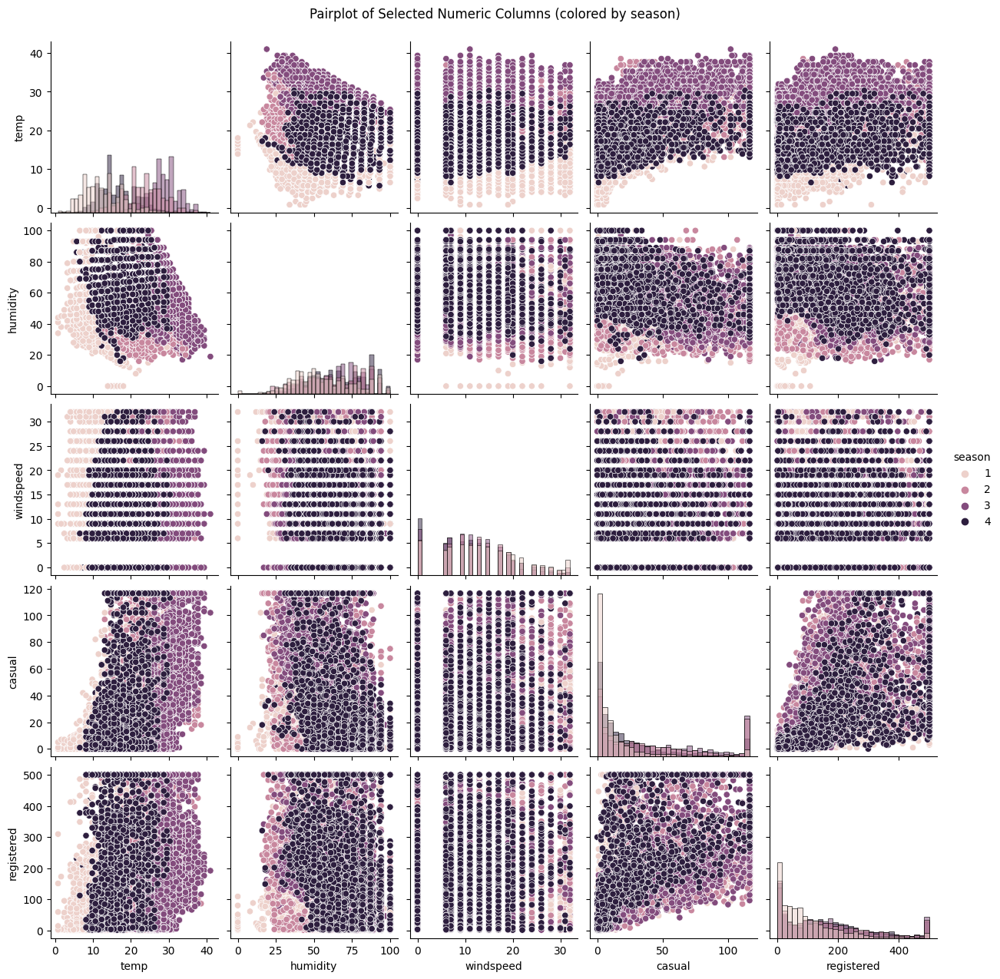

In [33]:
# Plot 1 - Pair plot for selected numeric columns with 'hue' as 'season'
selected_columns = ['temp', 'humidity', 'windspeed', 'casual', 'registered']
g = sns.pairplot(df_yulu, vars=selected_columns, hue='season', diag_kind="hist")
g.fig.suptitle('Pairplot of Selected Numeric Columns (colored by season)', y=1.02)

### Observations: -

The pair plots of all integer columns are plotted above. The max correlation of season 4 is observed w.r.t humidity and registered users, etc.

/Users/0438mpind/anaconda3/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


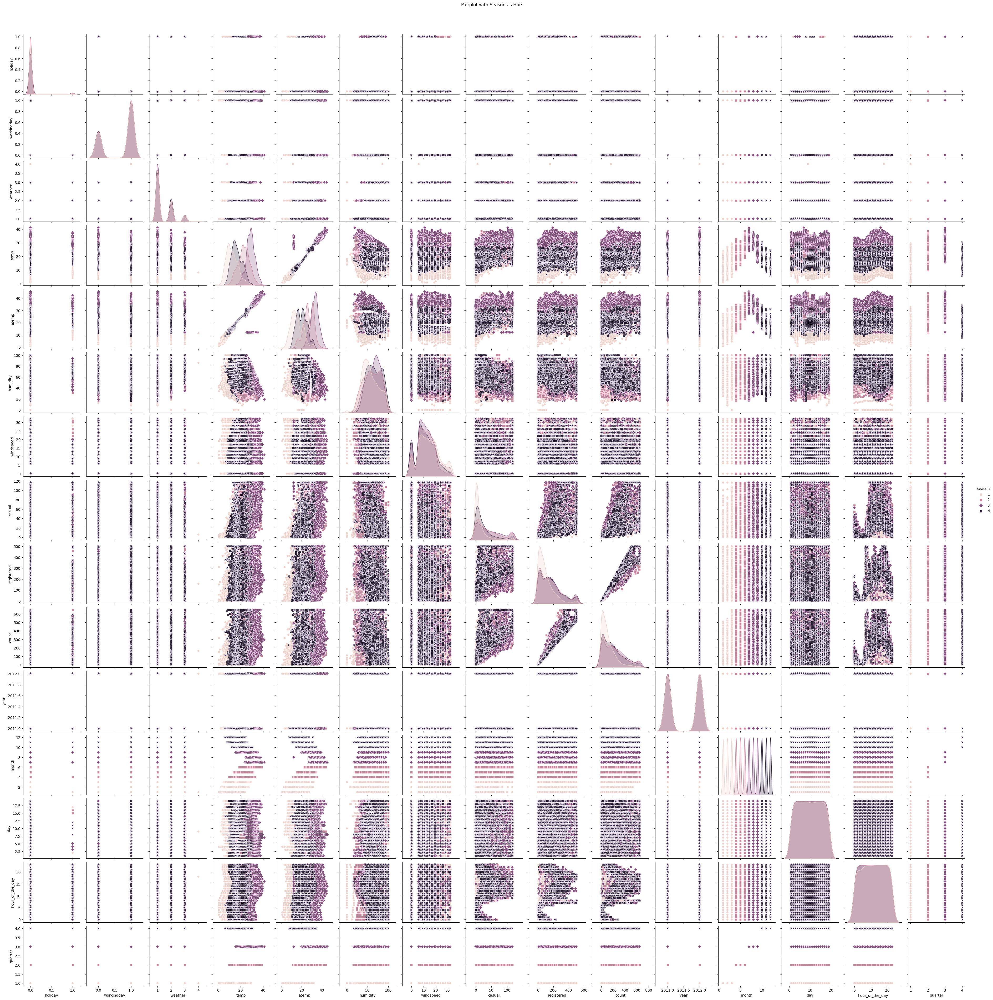

In [34]:
# Create a pairplot with 'season' as hue
sns.pairplot(df_yulu, hue='season', diag_kind='kde', markers=['o', 's', 'D', 'X'])
plt.suptitle('Pairplot with Season as Hue', y=1.02)
plt.show()

### Observations: -

Pair plots for all columns 

In [35]:
# Checking the data correlation

corr_data = df_yulu.corr()
corr_data

/var/folders/3x/g_8g6pcj3cv64hq5g80q28tw0000gp/T/ipykernel_36376/583479191.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_data = df_yulu.corr()


,temp,atemp,humidity,windspeed,casual,registered,count
temp,1.000000,0.984948,-0.064949,-0.015521,0.542221,0.330598,0.399567
atemp,0.984948,1.000000,-0.043536,-0.055305,0.535456,0.326758,0.395062
humidity,-0.064949,-0.043536,1.000000,-0.320072,-0.377872,-0.282891,-0.323456
windspeed,-0.015521,-0.055305,-0.320072,1.000000,0.110620,0.103144,0.109054
casual,0.542221,0.535456,-0.377872,0.110620,1.000000,0.599660,0.744425
registered,0.330598,0.326758,-0.282891,0.103144,0.599660,1.000000,0.971975
count,0.399567,0.395062,-0.323456,0.109054,0.744425,0.971975,1.000000


/var/folders/3x/g_8g6pcj3cv64hq5g80q28tw0000gp/T/ipykernel_36376/3054630516.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df_yulu.corr()


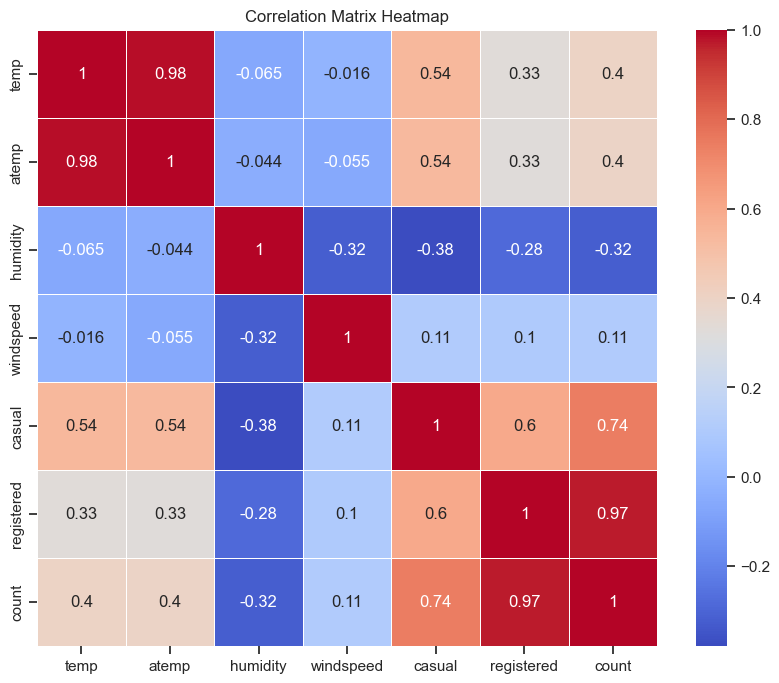

In [41]:
# Heatmap of the correlation matrix for numeric variables

corr_matrix = df_yulu.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

### Observations

1. Very High Correlation (> 0.9) exists between columns [atemp, temp] and [count, registered]
2. High positively / negatively correlation (0.7 - 0.9) does not exist between any columns.
3. Moderate positive correlation (0.5 - 0.7) exists between columns [casual, count], [casual, registered].
4. Low Positive correlation (0.3 - 0.5) exists between columns [count, temp], [count, atemp], [casual, atemp]
5. Negligible correlation exists between all other combinations of columns.

/Users/0438mpind/anaconda3/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


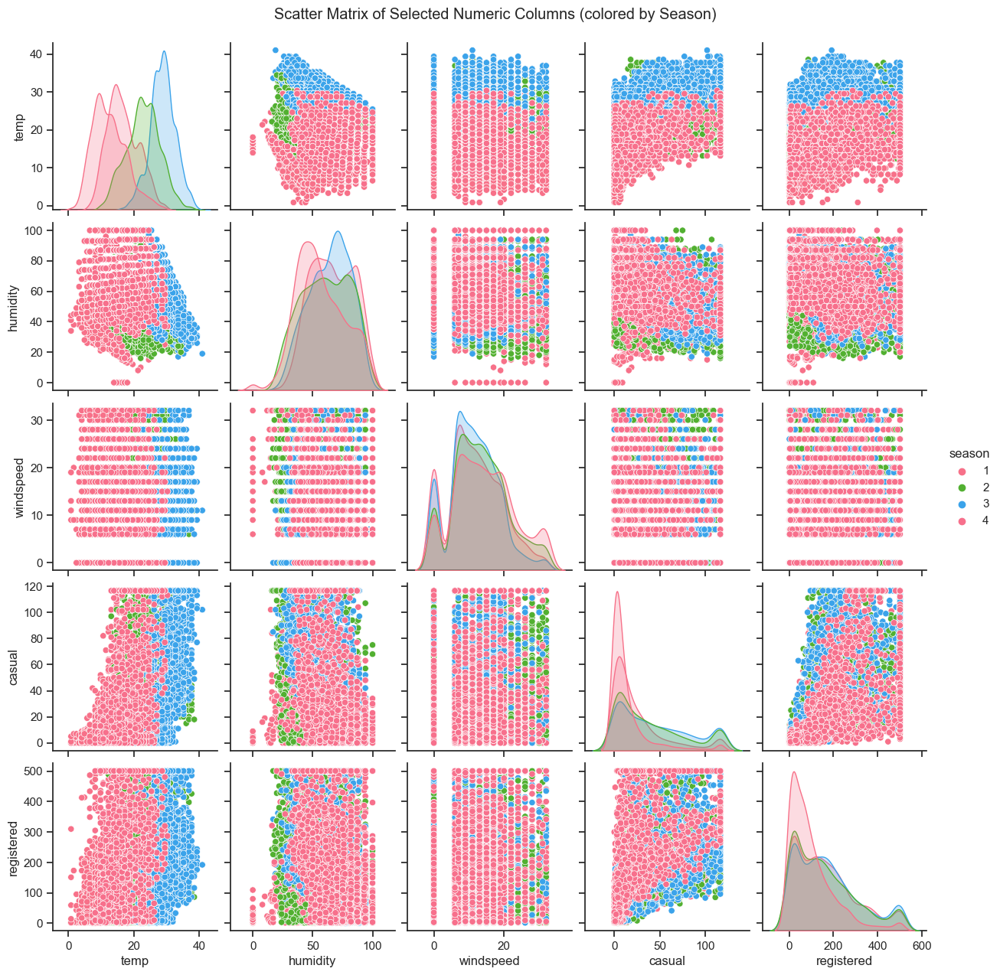

In [37]:
# Scatter matrix of selected numeric columns

selected_columns = ['temp', 'humidity', 'windspeed', 'casual', 'registered']
sns.set_theme(style="ticks")
sns.pairplot(df_yulu, vars=selected_columns, hue='season', palette='husl')
plt.suptitle('Scatter Matrix of Selected Numeric Columns (colored by Season)', y=1.02)
plt.show()

### Observations: -

Another pair plot for plotting numeric data

# Hypothesis Testing

## Q. Whether Working Day/Holiday has an effect on the count of rented electric cycles

In [38]:
# Dataframe for count of renting bikes w.r.t working day as working_days
count_working_day = df_yulu[df_yulu['workingday'] == 1]['count']

# Dataframe for count of renting bikes w.r.t non-working days as nonworking_days
count_non_working_day = df_yulu[df_yulu['workingday'] == 0]['count']

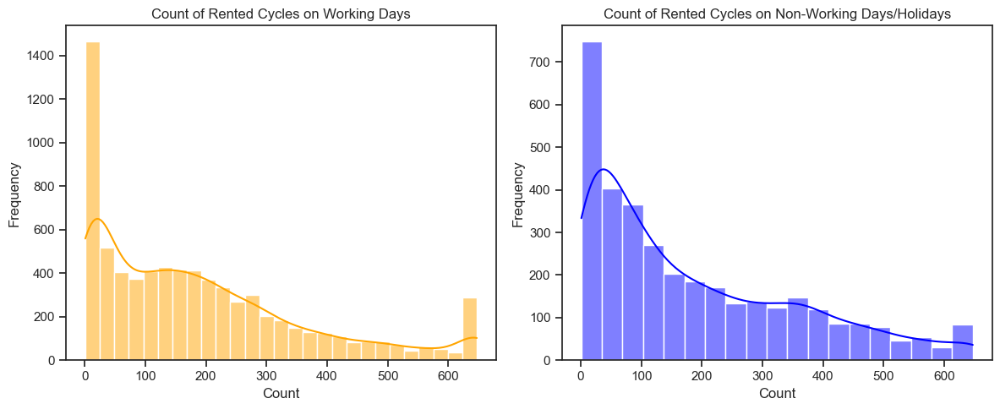

In [84]:
# Plotting distribution plots for above

# Setting up the subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Creating normal distribution plots for working days and non-working days
sns.histplot(count_working_day, kde=True, ax=axes[0],color='orange')
axes[0].set_title('Count of Rented Cycles on Working Days')
axes[0].set_xlabel('Count')
axes[0].set_ylabel('Frequency')

sns.histplot(count_non_working_day, kde=True, ax=axes[1], color='blue')
axes[1].set_title('Count of Rented Cycles on Non-Working Days/Holidays')
axes[1].set_xlabel('Count')
axes[1].set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()
plt.show()


In [73]:
# Checking for the normal distribution with Wilkin-Shapiro Test [Working days]

# Null Hypothesis(H0) : Data is distributed normally
# Alternate Hypothesis(Ha) : Data is not distributed normally

alpha = 0.05
workingday_smp = count_working_day.sample(100)
shapiro_stat,p_value = shapiro(workingday_smp)

print("Confidence Interval= 95%")
print("Wilkin-Shapiro test with Test Statistics: {}, and p-value: {}".format(shapiro_stat,p_value))
if p_value < alpha:
    print("Reject Ho: Data is not distributed normally")
else:
    print("Failed to reject Ho: Data is distributed normally")

Confidence Interval= 95%
Wilkin-Shapiro test with Test Statistics: 0.8483414649963379, and p-value: 1.0303542019585166e-08
Reject Ho: Data is not distributed normally


In [74]:
# Checking for the normal distribution with Wilkin-Shapiro Test [Holidays]

# Null Hypothesis(H0) : Data is distributed normally
# Alternate Hypothesis(Ha) : Data is not distributed normally

nonworkingdays_smp = count_non_working_day.sample(100)
shapiro_stat,p_value = shapiro(nonworkingdays_smp)
alpha = 0.05

print("Confidence Interval= 95%")
print("Wilkin-Shapiro test with Test Statistics: {}, and p-value: {}".format(shapiro_stat,p_value))
if p_value < alpha:
    print("Reject Ho: Data is not distributed normally")
else:
    print("Failed to reject Ho: Data is distributed normally")

Confidence Interval= 95%
Wilkin-Shapiro test with Test Statistics: 0.8896470069885254, and p-value: 4.755342501994164e-07
Reject Ho: Data is not distributed normally


In [46]:
# Checking for equal/similar variance among the two groups

print("Variance for Working Day group is : {}\n Variance for Non-Working Day group is : {}".format(np.var(count_working_day),np.var(count_non_working_day)))
print("The Ratio of the above two is : {}".format(np.var(count_working_day)/np.var(count_non_working_day)))


Variance for Working Day group is : 29774.454644861602
 Variance for Non-Working Day group is : 29617.640765896675
The Ratio of the above two is : 1.0052946107424428


### Setting up Null and Alternate Hypothesis for above question

Null Hypothesis (H0) = Working Day doesn't have impact on the count of rented electric cycles,i.e., count of rented electric cycles is same on working day and on non-working day.

Alternate Hypothesis (Ha) = Working Day has an impact on the count of rented electric cycles,i.e., count of rented electric cycles is more on working day than on non-working day.

Significance Value (alpha) = 0.05

Since data is not distributed normally (above plots), 2 categories are here, with working day being the categorical data and Count being the numerical.Also, the ratio between in variance among the two groups is low. Thus applying 2-Sample Independent T-Test.

In [47]:
# Performing a two-sample t-test
t_stat, p_value = ttest_ind(count_working_day, count_non_working_day)

# Set the significance level (alpha)
alpha = 0.05

# Check if the p-value is less than alpha
if p_value < alpha:
    print("Reject the null hypothesis.")
    print("Working day has a significant effect on the number of electric cycles rented, i.e., count of rented electric cycles is used more on working day than on holidays.")
    print(f"(p-value = {p_value})")
else:
    print("Fail to reject the null hypothesis.")
    print("Working day does not have a significant effect on the number of electric cycles rented, i.e., count of rented electric cycles is same as on working day than on holidays.")
    print(f"(p-value = {p_value})")

Fail to reject the null hypothesis.
Working day does not have a significant effect on the number of electric cycles rented, i.e., count of rented electric cycles is same as on working day than on holidays.
(p-value = 0.7517611135576576)


### Observations

1. 2 different datasets are created for working days and non-working days(holidays). After this, we have checked the data for normality in the distribution using Wilkin-Shapiro test. Its observed that the data doesn't follow normal distribution.

2. Set up the Null and Alternate hypothesis, as these data have two categories and the data is independent from each other, therefore, used Two Sample Independent T-Test on the data and checked the result with 95% confidence interval.

3. Its observed that since p-value is less than the significance level of 0.05, we can reject the null hypothesis and can conclude that Working Day has more usage of rented electric cycles,i.e., count of rented electric cycles is more on working day than on holidays.

## Q. ANNOVA to check if No. of cycles rented is similar or different in different 1. weather 2. season

### Whether Season has an effect on the count of rented electric cycles

In [48]:
# Creating different categories for each different type of season based on count of cycles rented

season1_smps = df_yulu.loc[(df_yulu["season"]==1),"count"]
season2_smps = df_yulu.loc[(df_yulu["season"]==2),"count"]
season3_smps = df_yulu.loc[(df_yulu["season"]==3),"count"]
season4_smps = df_yulu.loc[(df_yulu["season"]==4),"count"]

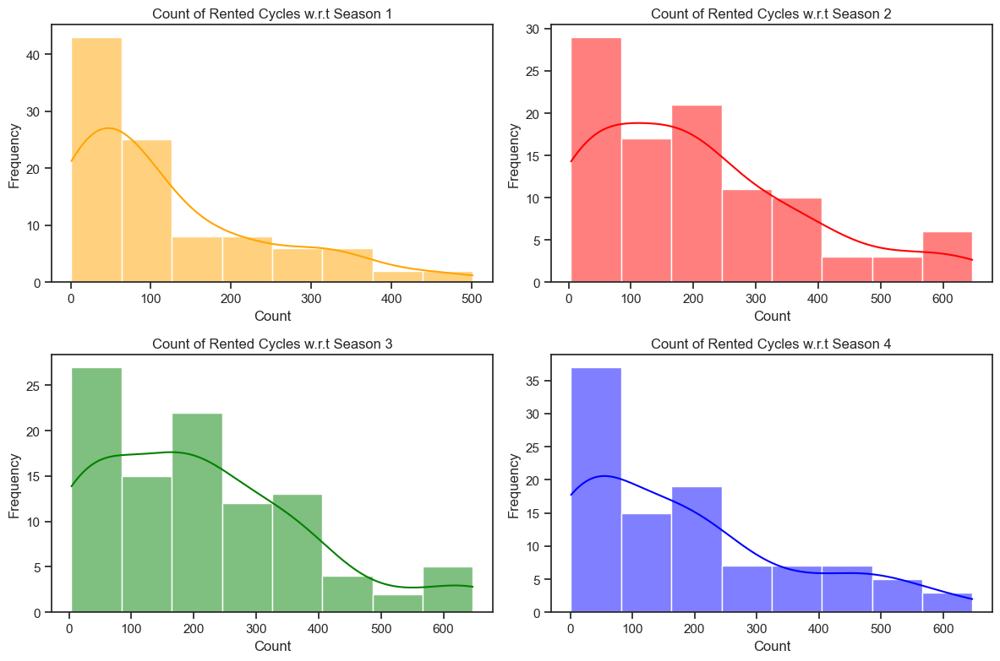

In [88]:
# Plotting distribution plots for the different seasons

# Setting up the subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Creating normal distribution plots for the different seasons
sns.histplot(season1_smps, kde=True, ax=axes[0, 0], color='orange')
axes[0, 0].set_title('Count of Rented Cycles w.r.t Season 1')
axes[0, 0].set_xlabel('Count')
axes[0, 0].set_ylabel('Frequency')

sns.histplot(season2_smps, kde=True, ax=axes[0, 1], color='red')
axes[0, 1].set_title('Count of Rented Cycles w.r.t Season 2')
axes[0, 1].set_xlabel('Count')
axes[0, 1].set_ylabel('Frequency')

sns.histplot(season3_smps, kde=True, ax=axes[1, 0], color='green')
axes[1, 0].set_title('Count of Rented Cycles w.r.t Season 3')
axes[1, 0].set_xlabel('Count')
axes[1, 0].set_ylabel('Frequency')

sns.histplot(season4_smps, kde=True, ax=axes[1, 1], color='blue')
axes[1, 1].set_title('Count of Rented Cycles w.r.t Season 4')
axes[1, 1].set_xlabel('Count')
axes[1, 1].set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()
plt.show()

In [89]:
# checking for the normal distribution with Wilkin-Shapiro Test [season 1]

# Null Hypothesis(H0) : Data is distributed normally
# Alternate Hypothesis(Ha) : Data is not distributed normally

season1_smps = season1_smps.sample(100)
shapiro_stat,p_value = shapiro(season1_smps)
alpha = 0.05

print("Confidence Interval= 95%")
print("Wilkin-Shapiro test with Test Statistics: {}, and p-value: {}".format(shapiro_stat,p_value))
if p_value < alpha:
    print("Reject Ho: Data is not distributed normally")
else:
    print("Failed to reject Ho: Data is distributed normally")

Confidence Interval= 95%
Wilkin-Shapiro test with Test Statistics: 0.849433422088623, and p-value: 1.130151972006388e-08
Reject Ho: Data is not distributed normally


In [90]:
# checking for the normal distribution with Wilkin-Shapiro Test [season 2]

# Null Hypothesis(H0) : Data is distributed normally
# Alternate Hypothesis(Ha) : Data is not distributed normally

season2_smps = season2_smps.sample(100)
shapiro_stat,p_value = shapiro(season2_smps)
alpha = 0.05

print("Confidence Interval= 95%")
print("Wilkin-Shapiro test with Test Statistics: {}, and p-value: {}".format(shapiro_stat,p_value))
if p_value < alpha:
    print("Reject Ho: Data is not distributed normally")
else:
    print("Failed to reject Ho: Data is distributed normally")

Confidence Interval= 95%
Wilkin-Shapiro test with Test Statistics: 0.9117276072502136, and p-value: 5.259171757643344e-06
Reject Ho: Data is not distributed normally


In [91]:
# checking for the normal distribution with Wilkin-Shapiro Test [season 3]

# Null Hypothesis(H0) : Data is distributed normally
# Alternate Hypothesis(Ha) : Data is not distributed normally

season3_smps = season3_smps.sample(100)
shapiro_stat,p_value = shapiro(season3_smps)
alpha = 0.05

print("Confidence Interval= 95%")
print("Wilkin-Shapiro test with Test Statistics: {}, and p-value: {}".format(shapiro_stat,p_value))
if p_value < alpha:
    print("Reject Ho: Data is not distributed normally")
else:
    print("Failed to reject Ho: Data is distributed normally")

Confidence Interval= 95%
Wilkin-Shapiro test with Test Statistics: 0.9155954122543335, and p-value: 8.280203473987058e-06
Reject Ho: Data is not distributed normally


In [92]:
# checking for the normal distribution with Wilkin-Shapiro Test [season 4]

# Null Hypothesis(H0) : Data is distributed normally
# Alternate Hypothesis(Ha) : Data is not distributed normally

season4_smps = season4_smps.sample(100)
shapiro_stat,p_value = shapiro(season4_smps)
alpha = 0.05

print("Confidence Interval= 95%")
print("Wilkin-Shapiro test with Test Statistics: {}, and p-value: {}".format(shapiro_stat,p_value))
if p_value < alpha:
    print("Reject Ho: Data is not distributed normally")
else:
    print("Failed to reject Ho: Data is distributed normally")

Confidence Interval= 95%
Wilkin-Shapiro test with Test Statistics: 0.8788182139396667, and p-value: 1.6179961903617368e-07
Reject Ho: Data is not distributed normally


In [53]:
# Checking for equal variance among the different groups with Levene's Test

# Null Hypothesis(H0) : Variance among the groups are equal.
# Alternate Hypothesis(Ha) : Variance among the groups are not equal.

alpha = 0.05
levene_stat,p_value = levene(season1_smps,season2_smps,season3_smps,season4_smps)

print("Confidence Interval= 95%")
print("Levene test with Test Statistic: {}, and p-value: {}".format(levene_stat,p_value))
if p_value < alpha:
    print("Reject Ho: Variance among the groups are not equal")
else:
    print("Failed to reject Ho: Variance among the groups are equal")

Confidence Interval= 95%
Levene test with Test Statistic: 4.755535415374494, and p-value: 0.002860238426954299
Reject Ho: Variance among the groups are not equal


### Setting up Null and Alternate Hypothesis for above question

Null Hypothesis (H0) = Season doesn't have impact on the count of rented electric cycles,i.e., No. of cycles are same in different seasons.

Alternate Hypothesis (Ha) = Season does have impact on the count of rented electric cycles,i.e., No. of cycles are different in different seasons.

Significance Value = 0.05

Data is not distributed normally, and variance among the groups are not equal, this violates the assumption of ANOVA. Also, we have more than two categories here, with season being the categorical data and Count being the numerical. Thus applying Kruskal-Wallis test for same.

In [54]:
#  Implementation of Kruskal-Wallis Test

test_statistic,p_value = kruskal(season1_smps,season2_smps,season3_smps,season4_smps)

alpha = 0.05
print("Kruskal-Wallis Test with Test Statistics: {}, and p-value: {}".format(test_statistic,p_value))

print("Confidence Interval: 95%")
if p_value < alpha:
    print("Reject Ho: Season does have impact on the count of rented electric cycles,i.e., No. of cycles are different in different seasons.")
else:
    print("Failed to reject Ho: Season doesn't have impact on the count of rented electric cycles,i.e., No. of cycles are same in different seasons")

Kruskal-Wallis Test with Test Statistics: 20.046051288787385, and p-value: 0.00016605282486259227
Confidence Interval: 95%
Reject Ho: Season does have impact on the count of rented electric cycles,i.e., No. of cycles are different in different seasons.


In [55]:
#  Implementation of ANOVA (f_oneway) Test

test_statistic,p_value = f_oneway(season1_smps,season2_smps,season3_smps,season4_smps)
print("ANOVA with Test Statistics: {}, and p-value: {}".format(test_statistic,p_value))
alpha = 0.05
print("Confidence Interval: 95%")
if p_value < alpha:
    print("Reject Ho: Season does have impact on the count of rented electric cycles,i.e., No. of cycles are different in different seasons.")
else:
    print("Failed to reject Ho: Season doesn't have impact on the count of rented electric cycles,i.e., No. of cycles are same in different seasons")

ANOVA with Test Statistics: 6.7676998183168315, and p-value: 0.00018455583004407485
Confidence Interval: 95%
Reject Ho: Season does have impact on the count of rented electric cycles,i.e., No. of cycles are different in different seasons.


### Observations: 

1. 4 different datasets for each season. After this, we have checked the data for normality in the distribution using Wilkin-Shapiro test, unfortunately, the data doesn't follow normal distribution. We also checked for the assumption for equal variance among these groups using Levene's test. We found that variance among the groups are not equal.

2. Set-up of the Null and Alternate hypothesis, as these data have more than two categories and the data is not normally distributed for each seasons and variance among the groups are also not equal, this violates the assumptions of ANOVA. Therefore, we have used Kruskal-Wallis Test on the data and checked the result with 95% confidence interval. We also used ANOVA (f_oneway) on the data.

3. We found in both the tests that: Since p-value is less than the significance level of 0.05, we can reject the null hypothesis and can conclude that Season does have impact on the count of rented electric cycles,i.e., No. of cycles is different in different seasons.

### Whether Weather has an effect on the count of rented electric cycles

In [56]:
# Creating different categories for each different type of weather based on count of cycles rented

weather1_smps = df_yulu.loc[(df_yulu["weather"]==1),"count"]
weather2_smps = df_yulu.loc[(df_yulu["weather"]==2),"count"]
weather3_smps = df_yulu.loc[(df_yulu["weather"]==3),"count"]
weather4_smps = df_yulu.loc[(df_yulu["weather"]==4),"count"]

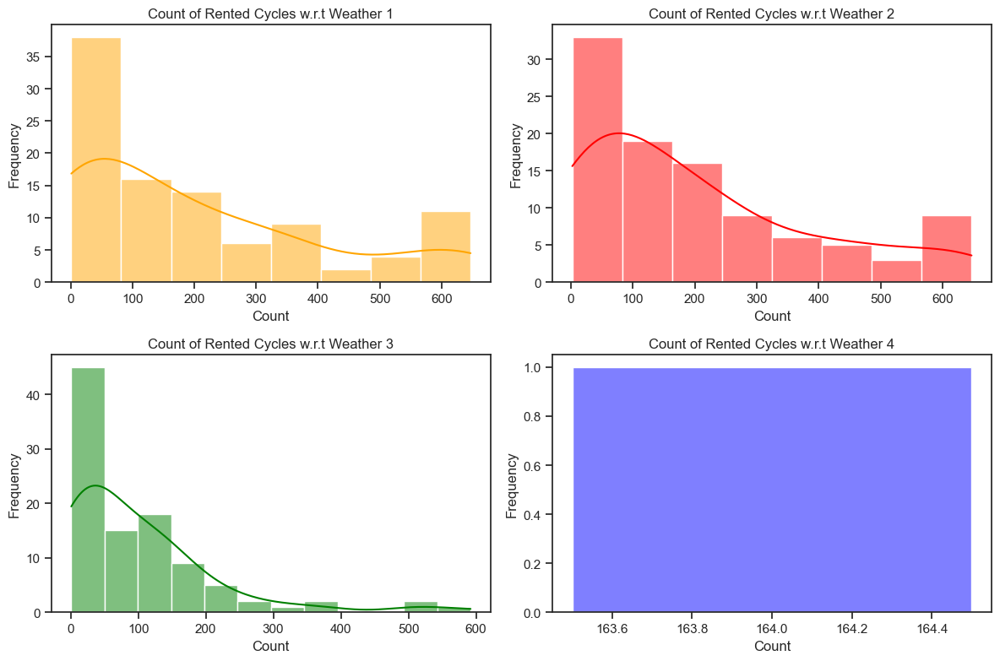

In [93]:
# Plotting distribution plots for the different weather

# Setting up the subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Creating normal distribution plots for the different seasons
sns.histplot(weather1_smps, kde=True, ax=axes[0, 0], color='orange')
axes[0, 0].set_title('Count of Rented Cycles w.r.t Weather 1')
axes[0, 0].set_xlabel('Count')
axes[0, 0].set_ylabel('Frequency')

sns.histplot(weather2_smps, kde=True, ax=axes[0, 1], color='red')
axes[0, 1].set_title('Count of Rented Cycles w.r.t Weather 2')
axes[0, 1].set_xlabel('Count')
axes[0, 1].set_ylabel('Frequency')

sns.histplot(weather3_smps, kde=True, ax=axes[1, 0], color='green')
axes[1, 0].set_title('Count of Rented Cycles w.r.t Weather 3')
axes[1, 0].set_xlabel('Count')
axes[1, 0].set_ylabel('Frequency')

sns.histplot(weather4_smps, kde=True, ax=axes[1, 1], color='blue')
axes[1, 1].set_title('Count of Rented Cycles w.r.t Weather 4')
axes[1, 1].set_xlabel('Count')
axes[1, 1].set_ylabel('Frequency')
# No proper distribution for plot 4 since only 1 datapoint is present

# Adjust layout
plt.tight_layout()
plt.show()

In [94]:
# checking for the normal distribution with Wilkin-Shapiro Test [weather 1]

# Null Hypothesis(H0) : Data is distributed normally
# Alternate Hypothesis(Ha) : Data is not distributed normally

weather1_smps = weather1_smps.sample(100)
shapiro_stat,p_value = shapiro(weather1_smps)
alpha = 0.05

print("Confidence Interval= 95%")
print("Wilkin-Shapiro test with Test Statistics: {}, and p-value: {}".format(shapiro_stat,p_value))
if p_value < alpha:
    print("Reject Ho: Data is not distributed normally")
else:
    print("Failed to reject Ho: Data is distributed normally")

Confidence Interval= 95%
Wilkin-Shapiro test with Test Statistics: 0.8514386415481567, and p-value: 1.3407565724321557e-08
Reject Ho: Data is not distributed normally


In [95]:
# checking for the normal distribution with Wilkin-Shapiro Test [weather 2]

# Null Hypothesis(H0) : Data is distributed normally
# Alternate Hypothesis(Ha) : Data is not distributed normally

weather2_smps = weather2_smps.sample(100)
shapiro_stat,p_value = shapiro(weather2_smps)
alpha = 0.05

print("Confidence Interval= 95%")
print("Wilkin-Shapiro test with Test Statistics: {}, and p-value: {}".format(shapiro_stat,p_value))
if p_value < alpha:
    print("Reject Ho: Data is not distributed normally")
else:
    print("Failed to reject Ho: Data is distributed normally")

Confidence Interval= 95%
Wilkin-Shapiro test with Test Statistics: 0.8781110048294067, and p-value: 1.5110263973383553e-07
Reject Ho: Data is not distributed normally


In [96]:
# checking for the normal distribution with Wilkin-Shapiro Test [weather 3]

# Null Hypothesis(H0) : Data is distributed normally
# Alternate Hypothesis(Ha) : Data is not distributed normally

weather3_smps = weather3_smps.sample(100)
shapiro_stat,p_value = shapiro(weather3_smps)
alpha = 0.05

print("Confidence Interval= 95%")
print("Wilkin-Shapiro test with Test Statistics: {}, and p-value: {}".format(shapiro_stat,p_value))
if p_value < alpha:
    print("Reject Ho: Data is not distributed normally")
else:
    print("Failed to reject Ho: Data is distributed normally")

Confidence Interval= 95%
Wilkin-Shapiro test with Test Statistics: 0.7768545150756836, and p-value: 5.1138940304618075e-11
Reject Ho: Data is not distributed normally


In [60]:
# Checking for equal variance among different groups with Levene's Test

# Null Hypothesis(H0) : Variance among the groups are equal.
# Alternate Hypothesis(Ha) : Variance among the groups are not equal.

alpha = 0.05
levene_stat,p_value = levene(weather1_smps,weather2_smps,weather3_smps,weather4_smps)

print("Confidence Interval: 95%")
print("Levene test with Test Statistic: {}, and p-value: {}".format(levene_stat,p_value))
if p_value < alpha:
    print("Reject Ho: Variance among the groups are not equal")
else:
    print("Failed to reject Ho: Variance among the groups are equal")

Confidence Interval: 95%
Levene test with Test Statistic: 9.447580126113285, and p-value: 5.567145134828813e-06
Reject Ho: Variance among the groups are not equal


### Setting up Null and Alternate Hypothesis

Null Hypothesis (H0) = Weather doesn't have impact on the count of rented electric cycles,i.e., No. of cycles are same in different weather.

Alternate Hypothesis (Ha) = Weather does have impact on the count of rented electric cycles,i.e., No. of cycles are different in different weather.

Significance Value = 0.05

Also, weather 4 has only one data point, so its not able to perform wilkin-shapiro test on it.

Data is not distributed normally, and variance among the groups are not equal, this violates the assumption of ANOVA. Moreover, we have more than two categories here, with season being the categorical data and count being the numerical. Thus applying Kruskal-Wallis test.

In [61]:
# Implementation of Kruskal-Wallis Test

alpha = 0.05
test_statistic,p_value = kruskal(weather1_smps,weather2_smps,weather3_smps,weather4_smps)
print("Kruskal-Wallis Test with Test Statistics: {}, and p-value: {}".format(test_statistic,p_value))

print("Confidence Interval= 95%")
if p_value < alpha:
    print("Reject Ho: Weather does have impact on the count of rented electric cycles,i.e., No. of cycles is different in different weather.")
else:
    print("Failed to reject Ho: Weather doesn't have impact on the count of rented electric cycles,i.e., No. of cycles is same in different weather")

Kruskal-Wallis Test with Test Statistics: 18.546331617290353, and p-value: 0.00033927153180920495
Confidence Interval= 95%
Reject Ho: Weather does have impact on the count of rented electric cycles,i.e., No. of cycles is different in different weather.


In [62]:
# Implementation of ANOVA(f_oneway)

test_statistic,p_value = f_oneway(weather1_smps,weather2_smps,weather3_smps,weather4_smps)
print("Kruskal-Wallis Test with Test Statistics: {}, and p-value: {}".format(test_statistic,p_value))
alpha = 0.05
print("Confidence Interval= 95%")
if p_value < alpha:
    print("Reject Ho: Weather does have impact on the count of rented electric cycles,i.e., No. of cycles is different in different weather.")
else:
    print("Failed to reject Ho: Weather doesn't have impact on the count of rented electric cycles,i.e., No. of cycles is same in different weather")

Kruskal-Wallis Test with Test Statistics: 7.973475018053148, and p-value: 3.953231010727268e-05
Confidence Interval= 95%
Reject Ho: Weather does have impact on the count of rented electric cycles,i.e., No. of cycles is different in different weather.


### Observations

1. 4 different datasets for each weather category. After this, checked the data for normality in the distribution using Wilkin-Shapiro test, unfortunately, the data doesn't follow normal distribution. We also checked for the assumption for equal variance among these groups using Levene's test. We found that variance among the groups are not equal.

2. Set-up of the Null and Alternate hypothesis, as these data have more than two categories and the data is not normally distributed for each weather and variance among the groups are also not equal, this violates the assumptions of ANOVA. Therefore, we have used Kruskal-Wallis Test on the data and checked the result with 95% confidence interval. We also used ANOVA (f_oneway) on the data.

3. We found in both the tests that: Since p-value is less than the significance level of 0.05, we can reject the null hypothesis and can conclude that Weather does have impact on the count of rented electric cycles,i.e., No. of cycles is different in different weather.

## Q. Whether Weather is dependent on the season?

In [63]:
# Creating a separate dataframe consisting of season,weather and corresponding count, and then calculating using crosstab their corresponding mean and putting them into a 2D numpy array.
weather_df = df_yulu[["season","weather","count"]]
weather_df = pd.crosstab(index=weather_df['season'],columns=weather_df['weather'],values = weather_df['count'], aggfunc = 'mean').fillna(0).reset_index(drop=True)
data=weather_df.values

### Setting up Null and Alternate Hypothesis

Null Hypothesis (H0) = Weather doesn't depend on the season.

Alternate Hypothesis (Ha) = Weather does depend on the season.

Significance Value = 0.05

We have two categories to compare here for the test of independence, thus applying chisquare test(chi2_contingency).

In [64]:
# Implementation of Chi-Square Test of Independence

test_statistic,p_value,dof,exp_freq = chi2_contingency(data)
print("Chi-Square Test of Independence with Test Statistic: {}, p-value: {}, and Degree of Freedom: {}".format(test_statistic,p_value,dof))
alpha = 0.05
print("Confidence Interval: 95%")
if p_value < alpha:
    print("Reject Ho: Weather does depend on the season.")
else:
    print("Failed to reject Ho: Weather doesn't depend on the season.")

Chi-Square Test of Independence with Test Statistic: 660.2731129124287, p-value: 2.3873348201023556e-136, and Degree of Freedom: 9
Confidence Interval: 95%
Reject Ho: Weather does depend on the season.


### Observations

1. Created a dataset of season and weather with their corresponding count of rented cycles. After this, used crosstab to create a dataframe with season in row axis and weather on column axis, and put the rows in a 2D numpy array.

2. Set-up of the Null and Alternate hypothesis, as these data have two categories to compare for dependency, therefore, used Chi-Square test of independence on the derived data and checked the result with 95% confidence interval.

3. Its found that: Since p-value is less than the significance level of 0.05, we can reject the null hypothesis and can conclude that Weather does depend on the season.

In [65]:
# Perform ANOVA for 'weather'
weather_categories = df_yulu['weather'].unique()
weather_data = [df_yulu[df_yulu['weather'] == cat]['count'] for cat in weather_categories]

# Perform the ANOVA test
weather_anova = stats.f_oneway(*weather_data)

# Perform ANOVA for 'season'
season_categories = df_yulu['season'].unique()
season_data = [df_yulu[df_yulu['season'] == cat]['count'] for cat in season_categories]

# Perform the ANOVA test
season_anova = stats.f_oneway(*season_data)

# Set the significance level (alpha)
alpha = 0.05

# Check the p-values for both tests
print("Case 1:- Weather")
if weather_anova.pvalue < alpha:
    print(f"Reject the null hypothesis for weather. Number of cycles rented is different for different weather categories (p-value = {weather_anova.pvalue})")
else:
    print(f"Fail to reject the null hypothesis for weather. Number of cycles rented is similar for different weather categories (p-value = {weather_anova.pvalue})")

print("\n")
print("Case 2:- Season")
if season_anova.pvalue < alpha:
    print(f"Reject the null hypothesis for season. Number of cycles rented is different for different season categories (p-value = {season_anova.pvalue})")
else:
    print(f"Fail to reject the null hypothesis for season. Number of cycles rented is similar for different season categories (p-value = {season_anova.pvalue})")


Case 1:- Weather
Reject the null hypothesis for weather. Number of cycles rented is different for different weather categories (p-value = 8.034967610817961e-44)


Case 2:- Season
Reject the null hypothesis for season. Number of cycles rented is different for different season categories (p-value = 7.771506553957677e-153)


/var/folders/3x/g_8g6pcj3cv64hq5g80q28tw0000gp/T/ipykernel_36376/1029627645.py:6: DeprecationWarning: Please use `f_oneway` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  weather_anova = stats.f_oneway(*weather_data)
/var/folders/3x/g_8g6pcj3cv64hq5g80q28tw0000gp/T/ipykernel_36376/1029627645.py:13: DeprecationWarning: Please use `f_oneway` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  season_anova = stats.f_oneway(*season_data)


### Q. Chi-square test to check if Weather is dependent on the season

In [66]:
# Creating a contingency table of observed frequencies
cont_tbl = pd.crosstab(df_yulu['season'], df_yulu['weather'])
cont_tbl

weather,1,2,3,4
season,,,,
1,1759,715,211,1
2,1801,708,224,0
3,1930,604,199,0
4,1702,807,225,0


In [67]:
# Creating a separate dataframe consisting of season,weather and corresponding count, and then calculating using crosstab their corresponding mean and putting them into a 2D numpy array.
weather_sm = df_yulu[["season","weather","count"]]
weather_sm = pd.crosstab(index=weather_sm['season'],columns=weather_sm['weather'],values = weather_sm['count'], aggfunc = 'mean').fillna(0).reset_index(drop=True)
data=weather_sm.values

### Setting up Null and Alternate Hypothesis

Null Hypothesis (H0) = Weather doesn't depend on the season.

Alternate Hypothesis (Ha) = Weather does depend on the season.

Significance Value = 0.05

We have two categories to compare here for the test of independence, thus applying chisquare test(chi2_contingency).

In [68]:
# Implementation of Chi-Square Test of Independence

alpha = 0.05
test_statistic,p_value,dof,exp_freq = chi2_contingency(data)
print("Chi-Square Test of Independence with Test Statistics: {}, p-value: {}, and Degree of Freedom: {}".format(test_statistic,p_value,dof))

print("Confidence Interval: 95%")

if p_value < alpha:
    print("Reject Ho: Weather does depend on the season.")
else:
    print("Failed to reject Ho: Weather doesn't depend on the season.")

Chi-Square Test of Independence with Test Statistics: 660.2731129124287, p-value: 2.3873348201023556e-136, and Degree of Freedom: 9
Confidence Interval: 95%
Reject Ho: Weather does depend on the season.


### Observations

1. We have created a dataset of season and weather with their corresponding count of rented cycles. After this, we have used crosstab to create a dataframe with season in row axis and weather on column axis, and put the rows in a 2D numpy array.

2. Set-up of the Null and Alternate hypothesis, as these data have two categories to compare for dependency, therefore, we have used Chi-Square test of independence on the derived data and checked the result with 95% confidence interval.

3. We found that: Since p-value is less than the significance level of 0.05, we can reject the null hypothesis and can conclude that Weather does depend on the season.

## Business Insights

1.  Electric cycle rentals are most popular among customers when the weather is clear or cloudy, primarily from January to August. Businesses can capitalize on this trend by ensuring cycle availability during these specific periods or seasons.
2.  It has been noticed that cycle rentals decrease significantly during rainy, stormy, snowy, or foggy weather conditions. Additionally, cycle rentals are extremely low when humidity drops below 20.
3.  Likewise, when the temperature falls below 10 degrees, there is a drop in the number of cycle rentals, and when the wind speed exceeds 35, cycle rentals also decrease.
4.  Registered users and casual riders exhibit distinct rental preferences. Registered users are more inclined to rent during regular workdays, particularly during office hours, while casual riders show a preference for renting on holidays. This differentiation can guide service providers in allocating more cycle during peak hours to cater to varied consumer needs.
5.  The number of registered riders significantly surpasses that of casual riders, offering valuable insights into customer retention and the quality of services provided by the business.
6.  Through hypothesis testing, it can be concluded that weather is influenced by the season, a fact that is readily apparent. Additionally, both weather and season have an impact on the quantity of cycle rented during specific periods.
7.  Peak hours for cycle rentals tend to coincide with typical working hours and commuting patterns. This implies that businesses can enhance their cycle availability during the morning and evening rush hours to serve the commuter demographic effectively.
8.  Among 100 users, approximately 19 fall into the category of casual users, while the remaining 81 are registered users.
9.  The average hourly cycle rental count is 144 for the year 2011 and 239 for the year 2012. This indicates an annual growth rate of 65.41% in the demand for electric vehicles on an hourly basis.
10. The count of rental cycle exhibits a seasonal trend, with elevated demand during spring and summer, a mild decrease in the autumn, and a more significant drop during the winter months.
11. Throughout the day, there is a noticeable fluctuation in cycle counts, characterized by low numbers in the early morning, a sudden surge in the morning, a peak count in the afternoon, and a gradual decrease in the evening and night time.
12. Humidity levels exceed 40 for more than 80% of the time, indicating that humidity mostly fluctuates between optimal and excessively moist conditions.
13. The average hourly cycle rental count exhibits no statistically significant difference between working and non-working days.
14. Hourly total cycle rentals exhibit statistical disparities across various weather conditions.
15. There are statistically significant variations in the hourly total number of cycle rentals among different seasons.

## Recommendations

1.  In summer and fall seasons, during clear or cloudy weather, the company should have more cycles in stock to be rented, as the demand during these seasons is higher as compared to other seasons.

2.  With a significance level of 0.05, working day does have effect on the number of cycles being rented. Therefore, it will be wise to put more cycles on roads to cater the needs of consumers (for registered ones). A nominal count of cycles available during holidays will cater the needs of casual riders.

3.  As mentioned above, days when temperature is less than 10, company should take out cycles from roads for maintenance, this will provide ample time for repairs.

4.  Similarly, days when windspeed is greater than 35 or in thunderstorms, company should take out cycles from roads for maintenance.

5.  Dynamic Pricing: Implement dynamic pricing strategies that adjust rental rates based on factors such as weather conditions, peak hours, and demand. Offering discounts during unfavorable weather or off-peak hours can attract more riders.

6.  Weather-Responsive Promotions: Launch weather-responsive promotions to incentivize riders during inclement weather. For example, offer reduced rates or special deals during rainy or hot seasons to encourage ridership.

7.  Seasonal Marketing Campaigns: Develop seasonal marketing campaigns that align with the patterns of ridership. Tailor advertising and promotions to coincide with the peak seasons in each region.

8.  Fleet Optimization: Analyze data to optimize the distribution and maintenance of the bicycle fleet. Ensure that cycles are readily available during peak hours and seasons, and conduct preventative maintenance during off-peak times.

9.  User Segmentation: Implement user-specific strategies. For casual users, focus on ease of access and user-friendly interfaces. For registered users, introduce loyalty programs and incentives for frequent usage.

10. Geographic Expansion: Utilize data to identify underserved areas with high demand for Yulu services. Plan geographic expansion into these regions, considering demographic and traffic patterns.

11. Public-Private Partnerships: Collaborate with local governments, transportation authorities, and private businesses to integrate Yulu services into existing transportation networks, making it convenient for commuters.

12. Safety Initiatives: Invest in safety measures, including safety training for riders, enhanced security for bicycles, and collaboration with local authorities to ensure safe riding conditions.

13. Feedback Mechanism: Implement a robust feedback system to gather insights from users about their experiences and expectations. Act on this feedback to improve services continually.

14. Sustainability Promotion: Promote the environmental benefits of cycling as a sustainable mode of transportation. Highlight the positive impact on reducing carbon emissions and air pollution.

15. Data-Driven Decision Making: Establish a data-driven culture within the organization. Use advanced analytics and machine learning to predict demand, optimize operations, and improve decision-making processes.

16. Community Building: Foster a community around Yulu services by organizing cycling events, community rides, and partnerships with local cycling clubs. Engage users in the brand and promote a sense of belonging.

17. Accessibility Enhancements: Improve accessibility for riders with disabilities. Ensure that Yulu services are inclusive and compliant with accessibility standards.

18. Collaborative Advertising: Collaborate with local businesses, tourism boards, and other organizations for co-marketing opportunities. Leverage partnerships to expand the reach of promotional campaigns.

19. Improve Weather Data Collection: Given the lack of records for extreme weather conditions, consider improving the data collection process for such scenarios. Having more data on extreme weather conditions can help to understand customer behavior and adjust the operations accordingly, such as offering specialized bike models for different weather conditions or implementing safety measures during extreme weather.
    
20. R&D and Innovation: Invest in research and development to innovate and offer new features and services, such as smart bike locks, IoT integration, and mobile app enhancements.
    
21. Special Occasion Discounts: Since Yulu focusses on providing a sustainable solution for vehicular pollution, it should give special discounts on the occassions like Zero Emissions Day (21st September), Earth day (22nd April), World Environment Day (5th June) etc in order to attract new users.
    
22. Weather-based Promotions: Recognize the impact of weather on bike rentals. Create weather-based promotions that target customers during clear and cloudy weather, as these conditions show the highest rental counts. Yulu can offer weather-specific discounts to attract more customers during these favorable weather conditions.

In [ ]:
-----EOF----